In [ ]:
# import necessary libraries
import pandas as pd,numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import warnings

# supress warnings
warnings.filterwarnings('ignore')

In [ ]:
# read dataset
df = pd.read_csv("telecom_churn_data.csv")
df.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0.0,1.0,1.0,1.0,NaN,968.0,30.40,0.00,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0.0,NaN,1.0,1.0,NaN,1006.0,0.00,0.00,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0.0,NaN,NaN,NaN,1.0,1103.0,0.00,0.00,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0.0,NaN,NaN,NaN,NaN,2491.0,0.00,0.00,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0.0,0.0,NaN,NaN,NaN,1526.0,0.00,0.00,0.00,0.00
5,7000286308,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,50.258,...,0.0,NaN,NaN,NaN,NaN,1471.0,0.00,0.00,0.00,0.00
6,7001051193,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,429.023,...,0.0,NaN,NaN,NaN,NaN,1673.0,0.00,0.00,0.00,0.00
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,...,0.0,NaN,NaN,NaN,NaN,802.0,57.74,19.38,18.74,0.00
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,...,0.0,NaN,1.0,1.0,NaN,315.0,21.03,910.65,122.16,0.00
9,7001864400,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,119.518,...,0.0,NaN,1.0,NaN,NaN,902.0,0.00,0.00,0.00,0.00


In [ ]:
#pd.set_option('display.max_columns',None)
#pd.set_option('display.max_rows',None)
pd.reset_option('display.max_columns')
pd.reset_option('display.max_rows')

In [ ]:
df.info(verbose = True,show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2644 entries, 0 to 2643
Data columns (total 226 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    mobile_number             2644 non-null   int64  
 1    circle_id                 2644 non-null   int64  
 2    loc_og_t2o_mou            2624 non-null   float64
 3    std_og_t2o_mou            2624 non-null   float64
 4    loc_ic_t2o_mou            2624 non-null   float64
 5    last_date_of_month_6      2644 non-null   object 
 6    last_date_of_month_7      2625 non-null   object 
 7    last_date_of_month_8      2616 non-null   object 
 8    last_date_of_month_9      2605 non-null   object 
 9    arpu_6                    2644 non-null   float64
 10   arpu_7                    2644 non-null   float64
 11   arpu_8                    2644 non-null   float64
 12   arpu_9                    2644 non-null   float64
 13   onnet_mou_6               2562 non-null   floa

In [ ]:
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,2.644000e+03,2644.0,2624.0,2624.0,2624.0,2644.000000,2644.000000,2644.000000,2644.000000,2562.000000,...,2643.000000,686.000000,702.000000,689.000000,691.000000,2643.000000,2643.000000,2643.000000,2643.000000,2643.000000
mean,7.001213e+09,109.0,0.0,0.0,0.0,279.322904,270.028442,269.760929,253.052408,126.384071,...,0.081725,0.911079,0.903134,0.901306,0.861071,1231.118426,61.113084,62.340568,56.624468,3.077874
std,6.942496e+05,0.0,0.0,0.0,0.0,289.455837,288.050457,294.465262,281.110265,295.794605,...,1.050638,0.284838,0.295986,0.298467,0.346123,960.195774,223.878542,261.367987,222.947496,32.382558
min,7.000000e+09,109.0,0.0,0.0,0.0,-160.795000,-2014.045000,-43.769000,-267.243000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000619e+09,109.0,0.0,0.0,0.0,95.353250,86.741750,80.157750,63.834500,7.980000,...,0.000000,1.000000,1.000000,1.000000,1.000000,471.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001220e+09,109.0,0.0,0.0,0.0,200.346000,191.658500,187.841000,174.163500,34.385000,...,0.000000,1.000000,1.000000,1.000000,1.000000,862.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001809e+09,109.0,0.0,0.0,0.0,368.957500,362.256750,362.381000,345.320500,112.382500,...,0.000000,1.000000,1.000000,1.000000,1.000000,1891.000000,0.000000,0.000000,0.000000,0.000000
max,7.002410e+09,109.0,0.0,0.0,0.0,3854.909000,2696.881000,3269.790000,3307.981000,6459.340000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4197.000000,3384.520000,3737.700000,4017.410000,1215.510000


In [ ]:
df.shape

(2644, 226)

In [ ]:
df.isnull().mean() * 100

mobile_number     0.000000
circle_id         0.000000
loc_og_t2o_mou    0.756430
std_og_t2o_mou    0.756430
loc_ic_t2o_mou    0.756430
                    ...   
aon               0.037821
aug_vbc_3g        0.037821
jul_vbc_3g        0.037821
jun_vbc_3g        0.037821
sep_vbc_3g        0.037821
Length: 226, dtype: float64

In [ ]:
len(df.loc[:,df.isnull().mean() * 100 > 10].columns)

40

In [ ]:
len(df.loc[:,df.isnull().mean() * 100 > 40].columns)

40

In [ ]:
# dropping columns with more than 40% null values
df = df.loc[:,df.isnull().mean() * 100 < 40][:]
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0.0,0.0,0.0,0.0,0.0,968.0,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0.0,0.0,0.0,0.0,0.0,1006.0,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0.0,0.0,0.0,0.0,0.0,1103.0,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0.0,0.0,0.0,0.0,0.0,2491.0,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0.0,0.0,0.0,0.0,0.0,1526.0,0.0,0.0,0.00,0.00


In [ ]:
df.shape

(2644, 186)

In [ ]:
df.drop(['mobile_number','circle_id'],axis = 1,inplace = True)

In [ ]:
df.shape

(2644, 184)

In [ ]:
df.info(verbose = True,show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2644 entries, 0 to 2643
Data columns (total 184 columns):
 #    Column                Non-Null Count  Dtype  
---   ------                --------------  -----  
 0    loc_og_t2o_mou        2624 non-null   float64
 1    std_og_t2o_mou        2624 non-null   float64
 2    loc_ic_t2o_mou        2624 non-null   float64
 3    last_date_of_month_6  2644 non-null   object 
 4    last_date_of_month_7  2625 non-null   object 
 5    last_date_of_month_8  2616 non-null   object 
 6    last_date_of_month_9  2605 non-null   object 
 7    arpu_6                2644 non-null   float64
 8    arpu_7                2644 non-null   float64
 9    arpu_8                2644 non-null   float64
 10   arpu_9                2644 non-null   float64
 11   onnet_mou_6           2562 non-null   float64
 12   onnet_mou_7           2548 non-null   float64
 13   onnet_mou_8           2503 non-null   float64
 14   onnet_mou_9           2444 non-null   float64
 15   of

In [ ]:
#df['date_of_last_rech_6'] = pd.to_datetime(df['date_of_last_rech_6'])
#df['date_of_last_rech_7'] = pd.to_datetime(df['date_of_last_rech_7'])
#df['date_of_last_rech_8'] = pd.to_datetime(df['date_of_last_rech_8'])
#df['date_of_last_rech_9'] = pd.to_datetime(df['date_of_last_rech_9'])

In [ ]:
#df.info(verbose = True,show_counts = True)

In [ ]:
df['last_date_of_month_6'].value_counts()

6/30/2014    2644
Name: last_date_of_month_6, dtype: int64

In [ ]:
df['last_date_of_month_7'].value_counts()

7/31/2014    2625
Name: last_date_of_month_7, dtype: int64

In [ ]:
df['last_date_of_month_8'].value_counts()

8/31/2014    2616
Name: last_date_of_month_8, dtype: int64

In [ ]:
df['last_date_of_month_9'].value_counts()

9/30/2014    2605
Name: last_date_of_month_9, dtype: int64

In [ ]:
# dropping columns which adds no meaning to model
df.drop(['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8',
        'last_date_of_month_9'],axis = 1,inplace = True)
df.shape

(2644, 180)

In [ ]:
df.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,0.0,0.0,0.0,197.385,214.816,213.803,21.100,NaN,NaN,0.00,...,0.0,0.0,0.0,0.0,0.0,968.0,30.4,0.0,101.20,3.58
1,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.11,78.68,7.68,...,0.0,0.0,0.0,0.0,0.0,1006.0,0.0,0.0,0.00,0.00
2,0.0,0.0,0.0,167.690,189.058,210.226,290.714,11.54,55.24,37.26,...,0.0,0.0,0.0,0.0,0.0,1103.0,0.0,0.0,4.17,0.00
3,0.0,0.0,0.0,221.338,251.102,508.054,389.500,99.91,54.39,310.98,...,0.0,0.0,0.0,0.0,0.0,2491.0,0.0,0.0,0.00,0.00
4,0.0,0.0,0.0,261.636,309.876,238.174,163.426,50.31,149.44,83.89,...,0.0,0.0,0.0,0.0,0.0,1526.0,0.0,0.0,0.00,0.00


In [ ]:
df.columns.values

array(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6',
       'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9',
       'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7',
       'std_og_t2m_mou_8', 'std_og_t2m_mou_9

In [ ]:
# drop date columns as it does not add any value
df.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9'],axis = 1,
       inplace = True)

In [ ]:
df.shape

(2644, 176)

In [ ]:
df[['last_day_rch_amt_6','total_rech_num_6','total_rech_amt_6','max_rech_amt_6']].head(10)

,last_day_rch_amt_6,total_rech_num_6,total_rech_amt_6,max_rech_amt_6
0,252,4,362,252
1,44,4,74,44
2,0,5,168,86
3,30,10,230,60
4,50,5,196,56
5,120,2,120,120
6,37,15,499,90
7,0,5,1580,1580
8,50,19,437,90
9,110,4,220,110


In [ ]:
# df[['onnet_mou_6','roam_ic_mou_6','roam_og_mou_6','loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6',
#    'loc_og_t2c_mou_6','loc_og_mou_6','std_og_t2t_mou_6','std_og_t2m_mou_6','std_og_t2f_mou_6','std_og_t2c_mou_6',
#    'std_og_mou_6','isd_og_mou_6','spl_og_mou_6','og_others_6','total_og_mou_6']].head(10)

In [ ]:
# all types outgoing mou for month 6 is listed in column total_og_mou_6
df[['onnet_mou_6','offnet_mou_6','roam_ic_mou_6','roam_og_mou_6','loc_og_mou_6','std_og_mou_6','isd_og_mou_6',
   'spl_og_mou_6','og_others_6','total_og_mou_6']].head(10)

,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
1,24.11,15.74,0.00,0.00,35.39,0.23,0.0,4.68,0.00,40.31
2,11.54,143.33,0.00,0.00,60.66,47.64,0.0,46.56,0.45,155.33
3,99.91,123.31,0.00,0.00,183.03,29.23,0.0,10.96,0.00,223.23
4,50.31,76.96,0.00,0.00,117.96,9.31,0.0,0.00,0.00,127.28
5,50.16,19.28,0.00,0.00,66.56,2.88,0.0,0.00,0.00,69.44
6,71.03,262.73,0.00,0.00,333.64,0.00,0.0,0.11,0.00,333.76
7,57.84,453.43,16.23,23.74,422.16,60.86,0.0,4.50,0.00,487.53
8,413.69,94.66,0.00,0.00,378.09,130.26,0.0,0.00,0.00,508.36
9,33.89,63.48,0.00,0.00,71.93,25.45,0.0,0.66,0.00,98.04


In [ ]:
# filter columns which has null values
null_col = df.loc[:,df.isnull().sum() > 0].columns.values
null_col

array(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9',
       'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9',
       'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9',
       'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
       'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6',
       'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
       'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_6', 'std_og_t2f_mou_7

## Handle null values

In [ ]:
# fill null values with median values
for col in null_col:
    df[col].fillna(df[col].median(),inplace = True)

In [ ]:
len(df.loc[:,df.isnull().sum() > 0].columns)

0

In [ ]:
df.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,0.0,0.0,0.0,197.385,214.816,213.803,21.100,34.385,30.40,0.00,...,0.0,0.0,0.0,0.0,0.0,968.0,30.4,0.0,101.20,3.58
1,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.110,78.68,7.68,...,0.0,0.0,0.0,0.0,0.0,1006.0,0.0,0.0,0.00,0.00
2,0.0,0.0,0.0,167.690,189.058,210.226,290.714,11.540,55.24,37.26,...,0.0,0.0,0.0,0.0,0.0,1103.0,0.0,0.0,4.17,0.00
3,0.0,0.0,0.0,221.338,251.102,508.054,389.500,99.910,54.39,310.98,...,0.0,0.0,0.0,0.0,0.0,2491.0,0.0,0.0,0.00,0.00
4,0.0,0.0,0.0,261.636,309.876,238.174,163.426,50.310,149.44,83.89,...,0.0,0.0,0.0,0.0,0.0,1526.0,0.0,0.0,0.00,0.00


## Filter high value customers

<Axes: >

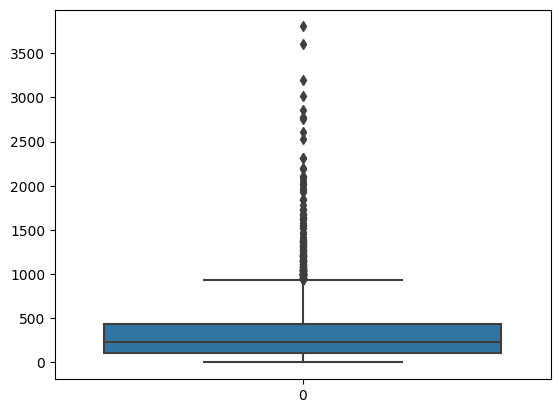

In [ ]:
sns.boxplot(df['total_rech_amt_6'])

In [ ]:
df['total_rech_amt_6'].describe()

count    2644.000000
mean      326.917927
std       354.454275
min         0.000000
25%       110.000000
50%       230.000000
75%       440.000000
max      3803.000000
Name: total_rech_amt_6, dtype: float64

In [ ]:
# taking average of month 6 and 7
df['total_rech_amt_6_7'] = (df['total_rech_amt_6'] + df['total_rech_amt_7'])/2

In [ ]:
np.percentile(df['total_rech_amt_6_7'],70)

370.5

In [ ]:
# customers who spend more than 70 percentile of average recharge amount in 6 and 7th month are
# filtered as high value customers
df = df[df['total_rech_amt_6_7'] >= np.percentile(df['total_rech_amt_6_7'],70)][:]

In [ ]:
df['total_rech_amt_6_7'].sort_values()

2323     370.5
1760     370.5
1669     371.0
1004     371.5
547      372.0
         ...  
1234    2597.0
1361    3287.5
844     3294.0
241     3536.5
588     4011.0
Name: total_rech_amt_6_7, Length: 794, dtype: float64

In [ ]:
df.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_6_7
7,0.0,0.0,0.0,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,...,0.0,0.0,0.0,0.0,802.0,57.74,19.38,18.74,0.0,1185.0
8,0.0,0.0,0.0,378.721,492.223,137.362,166.787,413.69,351.03,35.08,...,0.0,0.0,0.0,0.0,315.0,21.03,910.65,122.16,0.0,519.0
13,0.0,0.0,0.0,492.846,205.671,593.260,322.732,501.76,108.39,534.24,...,0.0,0.0,0.0,0.0,2607.0,0.00,0.00,0.00,0.0,380.0
16,0.0,0.0,0.0,430.975,299.869,187.894,206.490,50.51,74.01,70.61,...,0.0,0.0,0.0,0.0,511.0,0.00,2.45,21.89,0.0,459.0
17,0.0,0.0,0.0,690.008,18.980,25.499,257.583,1185.91,9.28,7.79,...,0.0,0.0,0.0,0.0,667.0,0.00,0.00,0.00,0.0,408.0


In [ ]:
df[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']]

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
7,0.00,0.00,0.00,0.00
8,34.91,142.18,0.00,0.00
13,631.86,446.09,0.00,0.00
16,334.56,255.74,0.00,0.00
17,87.13,631.08,0.00,0.00
...,...,...,...,...
2633,36.51,3.54,908.55,0.00
2635,451.14,113.81,28.78,302.21
2638,146.59,694.69,0.00,0.00
2641,119.51,147.86,0.00,0.00


In [ ]:
# df['churn'] = df[(df['total_ic_mou_9'] == 0) & (df['total_og_mou_9'] == 0) & (df['vol_2g_mb_9'] == 0)
#    & (df['vol_3g_mb_9'] == 0)][:]

### Tag churners

In [ ]:
def func(x):
    if((x['total_ic_mou_9'] == 0) & (x['total_og_mou_9'] == 0) & (x['vol_2g_mb_9'] == 0)
   & (x['vol_3g_mb_9'] == 0)):
        return 1
    else:
        return 0


df['churn'] = df.apply(lambda x: func(x),axis = 1)

In [ ]:
df[(df['total_ic_mou_9'] == 0) & (df['total_og_mou_9'] == 0) & (df['vol_2g_mb_9'] == 0)
    & (df['vol_3g_mb_9'] == 0)]['churn'].value_counts()

1    63
Name: churn, dtype: int64

In [ ]:
df['churn'].value_counts(normalize = True) * 100

0    92.065491
1     7.934509
Name: churn, dtype: float64

### Checking data imbalance

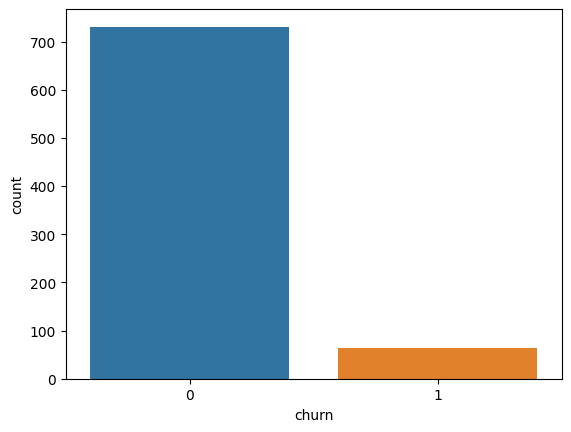

In [ ]:
sns.countplot(data = df, x = 'churn');

### Only 8.6% of customers have churned, so there is huge data imbalance in the dataset

#### Dropping _9 columns

In [ ]:
import re

arr_9 = []

for col in df.columns.values:
    if re.search("_9$",col):
        arr_9.append(col)

arr_9

['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_t2c_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_t2o_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'last_day_rch_amt_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9']

In [ ]:
df.drop(arr_9,axis = 1,inplace = True)
df.columns.values

array(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6',
       'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
       'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6',
       'isd_og_mou_7', 'isd_og_

### Combine 6th and 7th month data

In [ ]:
arr_6 = []
arr_7 = []

for col in df.columns.values:
    if re.search("_6$",col):
        arr_6.append(col)

for col in df.columns.values:
    if re.search("_7$",col):
        arr_7.append(col)

In [ ]:
arr_6

['arpu_6',
 'onnet_mou_6',
 'offnet_mou_6',
 'roam_ic_mou_6',
 'roam_og_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_t2m_mou_6',
 'loc_og_t2f_mou_6',
 'loc_og_t2c_mou_6',
 'loc_og_mou_6',
 'std_og_t2t_mou_6',
 'std_og_t2m_mou_6',
 'std_og_t2f_mou_6',
 'std_og_t2c_mou_6',
 'std_og_mou_6',
 'isd_og_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'total_og_mou_6',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_t2f_mou_6',
 'std_ic_t2o_mou_6',
 'std_ic_mou_6',
 'total_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'total_rech_num_6',
 'total_rech_amt_6',
 'max_rech_amt_6',
 'last_day_rch_amt_6',
 'vol_2g_mb_6',
 'vol_3g_mb_6',
 'monthly_2g_6',
 'sachet_2g_6',
 'monthly_3g_6',
 'sachet_3g_6']

In [ ]:
arr_7

['arpu_7',
 'onnet_mou_7',
 'offnet_mou_7',
 'roam_ic_mou_7',
 'roam_og_mou_7',
 'loc_og_t2t_mou_7',
 'loc_og_t2m_mou_7',
 'loc_og_t2f_mou_7',
 'loc_og_t2c_mou_7',
 'loc_og_mou_7',
 'std_og_t2t_mou_7',
 'std_og_t2m_mou_7',
 'std_og_t2f_mou_7',
 'std_og_t2c_mou_7',
 'std_og_mou_7',
 'isd_og_mou_7',
 'spl_og_mou_7',
 'og_others_7',
 'total_og_mou_7',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2f_mou_7',
 'loc_ic_mou_7',
 'std_ic_t2t_mou_7',
 'std_ic_t2m_mou_7',
 'std_ic_t2f_mou_7',
 'std_ic_t2o_mou_7',
 'std_ic_mou_7',
 'total_ic_mou_7',
 'spl_ic_mou_7',
 'isd_ic_mou_7',
 'ic_others_7',
 'total_rech_num_7',
 'total_rech_amt_7',
 'max_rech_amt_7',
 'last_day_rch_amt_7',
 'vol_2g_mb_7',
 'vol_3g_mb_7',
 'monthly_2g_7',
 'sachet_2g_7',
 'monthly_3g_7',
 'sachet_3g_7',
 'total_rech_amt_6_7']

In [ ]:
arr_7 = arr_7[:-1]

In [ ]:
arr_7

['arpu_7',
 'onnet_mou_7',
 'offnet_mou_7',
 'roam_ic_mou_7',
 'roam_og_mou_7',
 'loc_og_t2t_mou_7',
 'loc_og_t2m_mou_7',
 'loc_og_t2f_mou_7',
 'loc_og_t2c_mou_7',
 'loc_og_mou_7',
 'std_og_t2t_mou_7',
 'std_og_t2m_mou_7',
 'std_og_t2f_mou_7',
 'std_og_t2c_mou_7',
 'std_og_mou_7',
 'isd_og_mou_7',
 'spl_og_mou_7',
 'og_others_7',
 'total_og_mou_7',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2f_mou_7',
 'loc_ic_mou_7',
 'std_ic_t2t_mou_7',
 'std_ic_t2m_mou_7',
 'std_ic_t2f_mou_7',
 'std_ic_t2o_mou_7',
 'std_ic_mou_7',
 'total_ic_mou_7',
 'spl_ic_mou_7',
 'isd_ic_mou_7',
 'ic_others_7',
 'total_rech_num_7',
 'total_rech_amt_7',
 'max_rech_amt_7',
 'last_day_rch_amt_7',
 'vol_2g_mb_7',
 'vol_3g_mb_7',
 'monthly_2g_7',
 'sachet_2g_7',
 'monthly_3g_7',
 'sachet_3g_7']

In [ ]:
# taking average of 6th and 7th month data
for i in range(len(arr_6)):
    df[arr_6[i]+'_7'] = (df[arr_6[i]] + df[arr_7[i]])/2

In [ ]:
df.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,...,ic_others_6_7,total_rech_num_6_7,max_rech_amt_6_7,last_day_rch_amt_6_7,vol_2g_mb_6_7,vol_3g_mb_6_7,monthly_2g_6_7,sachet_2g_6_7,monthly_3g_6_7,sachet_3g_6_7
7,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,...,15.465,5.0,1185.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,35.08,94.66,...,0.000,20.0,122.0,25.0,178.0,375.475,0.5,0.5,0.0,0.0
13,0.0,0.0,0.0,492.846,205.671,593.260,501.76,108.39,534.24,413.31,...,49.860,5.0,110.0,80.0,0.0,0.000,0.0,0.0,0.0,0.0
16,0.0,0.0,0.0,430.975,299.869,187.894,50.51,74.01,70.61,296.29,...,0.000,8.0,110.0,100.0,0.0,0.000,0.0,0.0,0.0,0.0
17,0.0,0.0,0.0,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,...,0.000,10.5,55.0,15.0,0.0,0.000,0.0,0.0,0.0,0.0


In [ ]:
df.columns.values

array(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6',
       'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
       'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6',
       'isd_og_mou_7', 'isd_og_

In [ ]:
# dropping 6th and 7th month individual data
df.drop(arr_6,axis = 1,inplace = True)
df.drop(arr_7,axis = 1,inplace = True)

In [ ]:
df.columns.values

array(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_8',
       'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_t2c_mou_8',
       'std_og_mou_8', 'isd_og_mou_8', 'spl_og_mou_8', 'og_others_8',
       'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8',
       'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_t2o_mou_8',
       'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8',
       'ic_others_8', 'total_rech_num_8', 'total_rech_amt_8',
       'max_rech_amt_8', 'last_day_rch_amt_8', 'vol_2g_mb_8',
       'vol_3g_mb_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8',
       'sachet_3g_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g', 'total_rech_amt_6_7', 'churn', 'arpu_

### EDA

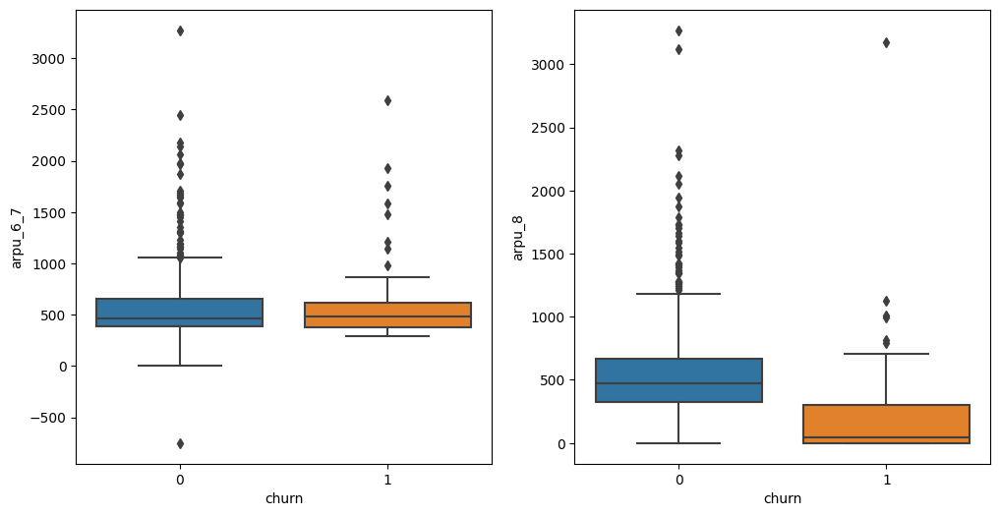

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'arpu_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'arpu_8')

plt.show()

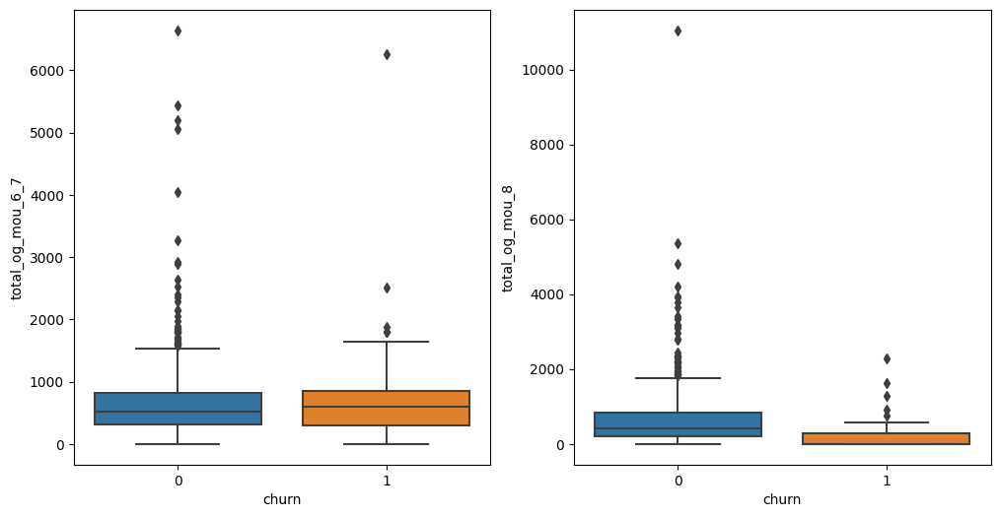

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'total_og_mou_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'total_og_mou_8')

plt.show()

#### Minutes of usage of people who churned has decreased in the month of august

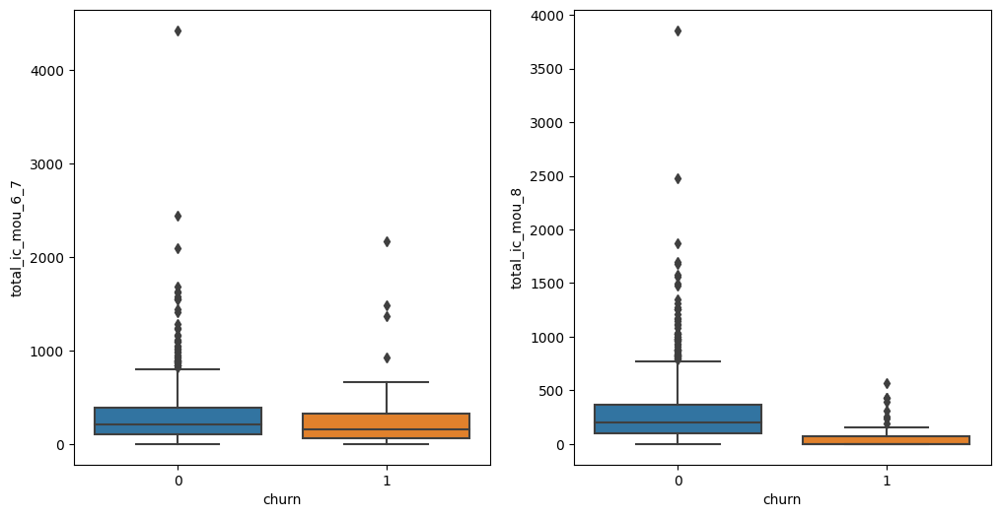

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'total_ic_mou_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'total_ic_mou_8')

plt.show()

#### Total incoming call of people who churned has decreased in the month of august

In [ ]:
df[['monthly_2g_8','sachet_2g_8','vol_2g_mb_8']]

,monthly_2g_8,sachet_2g_8,vol_2g_mb_8
7,0.0,0.0,0.00
8,0.0,3.0,0.03
13,0.0,3.0,0.02
16,0.0,0.0,0.00
17,0.0,0.0,0.00
...,...,...,...
2633,0.0,10.0,496.31
2635,0.0,0.0,0.00
2638,0.0,0.0,0.00
2641,0.0,0.0,0.00


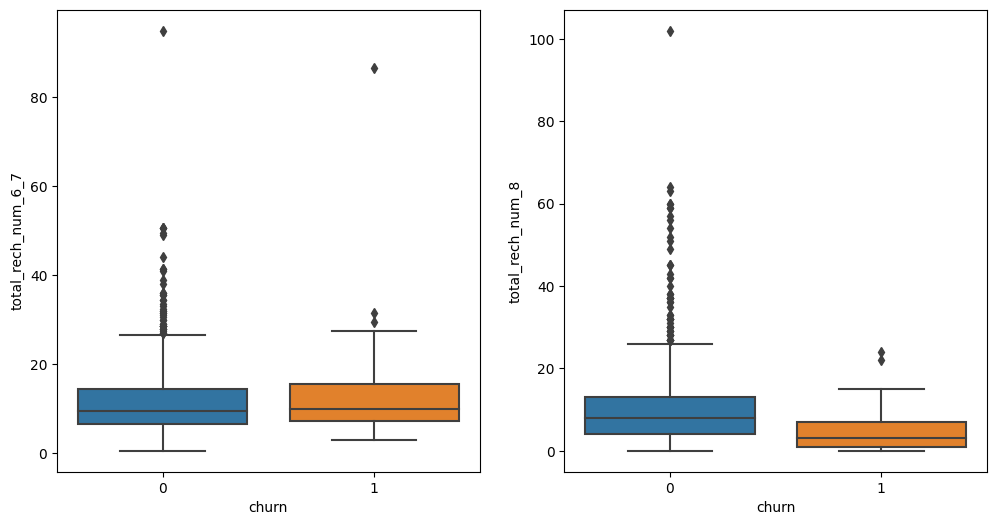

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'total_rech_num_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'total_rech_num_8')

plt.show()

#### Total number of recharge has decreased in the month of august for people who churned

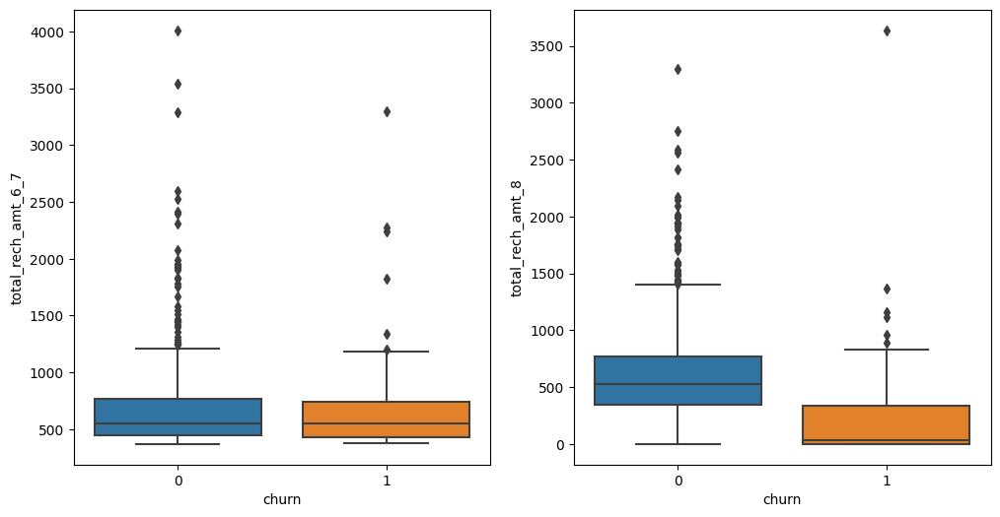

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'total_rech_amt_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'total_rech_amt_8')

plt.show()

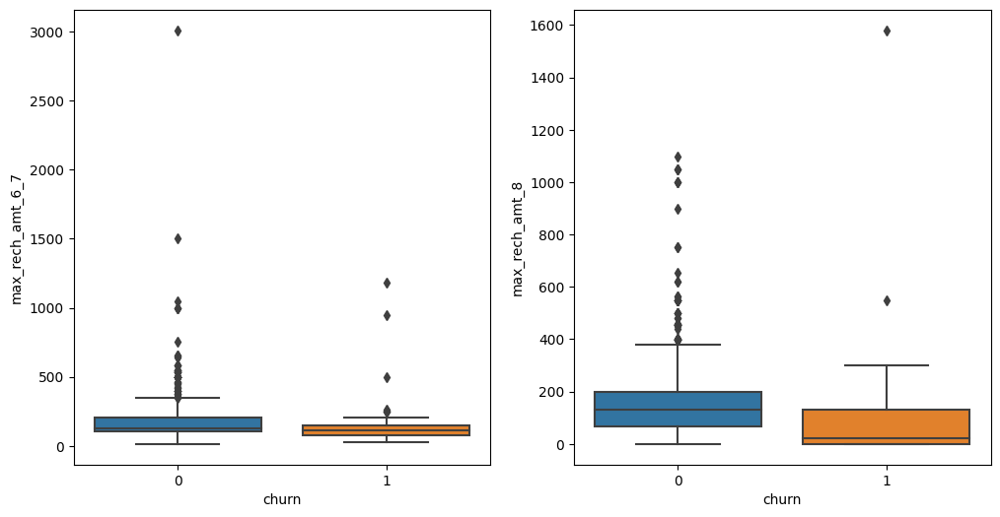

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'max_rech_amt_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'max_rech_amt_8')

plt.show()

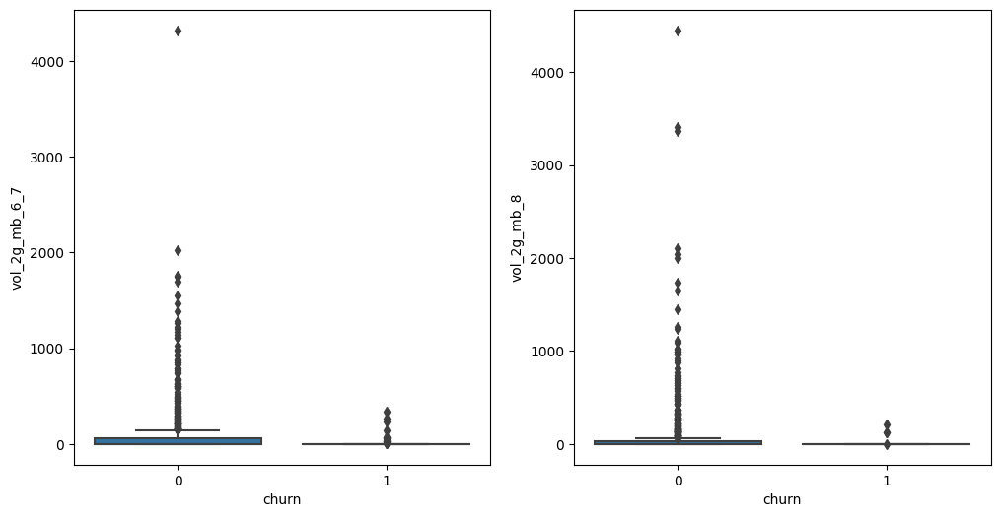

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'vol_2g_mb_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'vol_2g_mb_8')

plt.show()

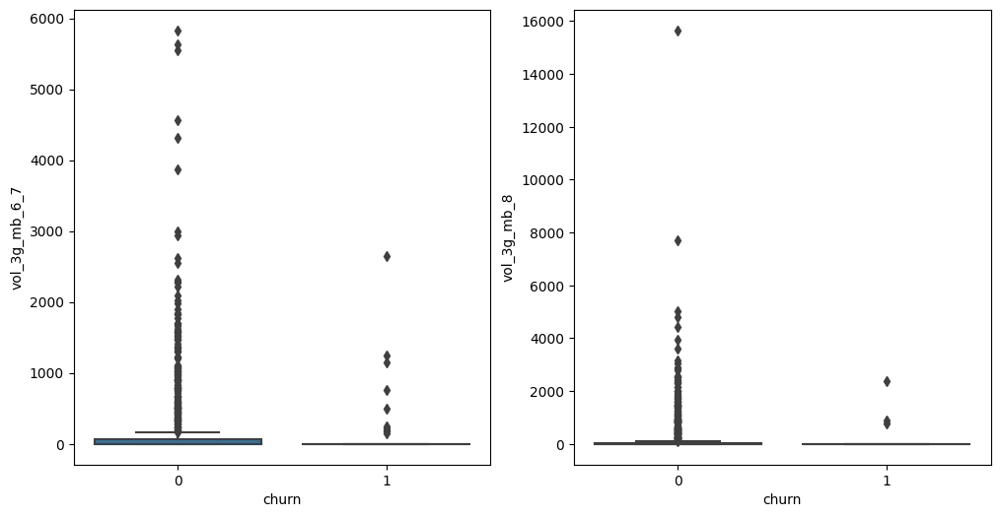

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'vol_3g_mb_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'vol_3g_mb_8')

plt.show()

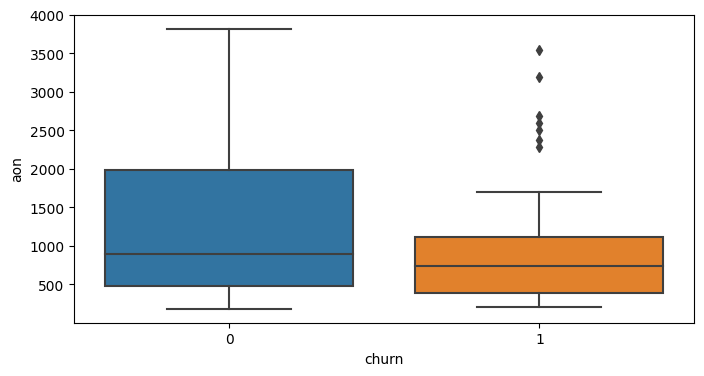

In [ ]:
plt.figure(figsize = [8,4])

sns.boxplot(data = df,x= 'churn',y = 'aon')

plt.show()

#### Most of the people who are in the network for a longer period are less likely to churn

### Rename columns

In [ ]:
df.rename(columns = {'jun_vbc_3g':'vbc_3g_6','jul_vbc_3g':'vbc_3g_7','aug_vbc_3g':'vbc_3g_8'},inplace = True)

In [ ]:
df['vbc_3g_6_7'] = (df['vbc_3g_6'] + df['vbc_3g_7'])/2
df.drop(['sep_vbc_3g'],axis = 1,inplace = True)

In [ ]:
df['vbc_3g_6_7']

7        19.060
8       516.405
13        0.000
16       12.170
17        0.000
         ...   
2633      0.000
2635    343.025
2638      0.000
2641      0.000
2643      0.000
Name: vbc_3g_6_7, Length: 794, dtype: float64

In [ ]:
df['vbc_3g_6']

7        18.74
8       122.16
13        0.00
16       21.89
17        0.00
         ...  
2633      0.00
2635    300.38
2638      0.00
2641      0.00
2643      0.00
Name: vbc_3g_6, Length: 794, dtype: float64

In [ ]:
df['vbc_3g_7']

7        19.38
8       910.65
13        0.00
16        2.45
17        0.00
         ...  
2633      0.00
2635    385.67
2638      0.00
2641      0.00
2643      0.00
Name: vbc_3g_7, Length: 794, dtype: float64

In [ ]:
df.drop(['vbc_3g_6','vbc_3g_7'],axis = 1, inplace = True)
df.columns.values

array(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_8',
       'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_t2c_mou_8',
       'std_og_mou_8', 'isd_og_mou_8', 'spl_og_mou_8', 'og_others_8',
       'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8',
       'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_t2o_mou_8',
       'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8',
       'ic_others_8', 'total_rech_num_8', 'total_rech_amt_8',
       'max_rech_amt_8', 'last_day_rch_amt_8', 'vol_2g_mb_8',
       'vol_3g_mb_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8',
       'sachet_3g_8', 'aon', 'vbc_3g_8', 'total_rech_amt_6_7', 'churn',
       'arpu_6_7', 'onnet_mou_6_7', 'offnet_mou_6_7', 'ro

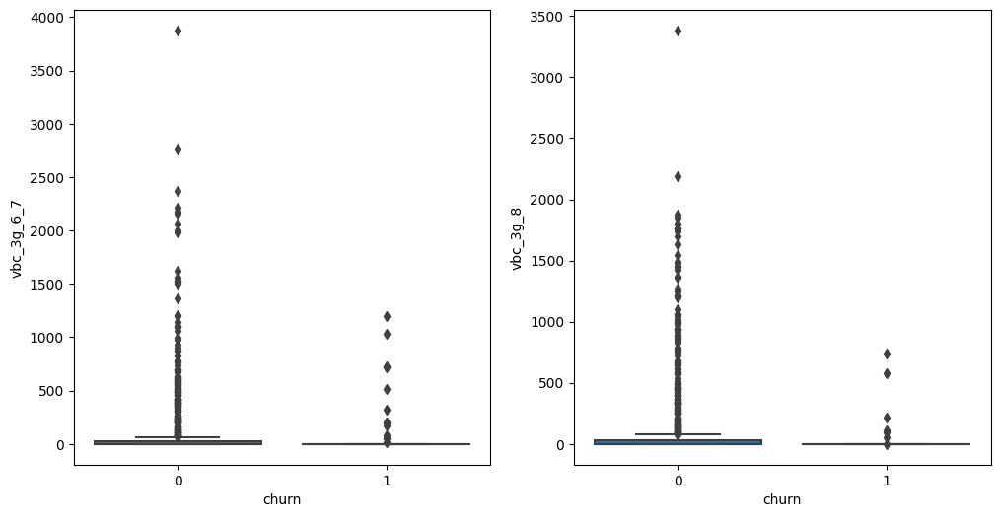

In [ ]:
plt.figure(figsize = [12,6])

plt.subplot(1,2,1)
sns.boxplot(data = df,x= 'churn',y = 'vbc_3g_6_7')

plt.subplot(1,2,2)
sns.boxplot(data = df,x= 'churn',y = 'vbc_3g_8')

plt.show()

In [ ]:
col_plot1 = ['arpu_6_7','arpu_8','total_og_mou_6_7','total_og_mou_8','total_ic_mou_6_7']
col_plot2 = ['total_ic_mou_8','total_rech_num_6_7','total_rech_num_8','total_rech_amt_6_7']
col_plot3 = ['total_rech_amt_8','max_rech_amt_6_7','max_rech_amt_8','vol_2g_mb_6_7']
col_plot4 = ['vol_2g_mb_8','vol_3g_mb_6_7','vol_3g_mb_8','aon','vbc_3g_6_7','vbc_3g_8']

<Figure size 2000x3000 with 0 Axes>

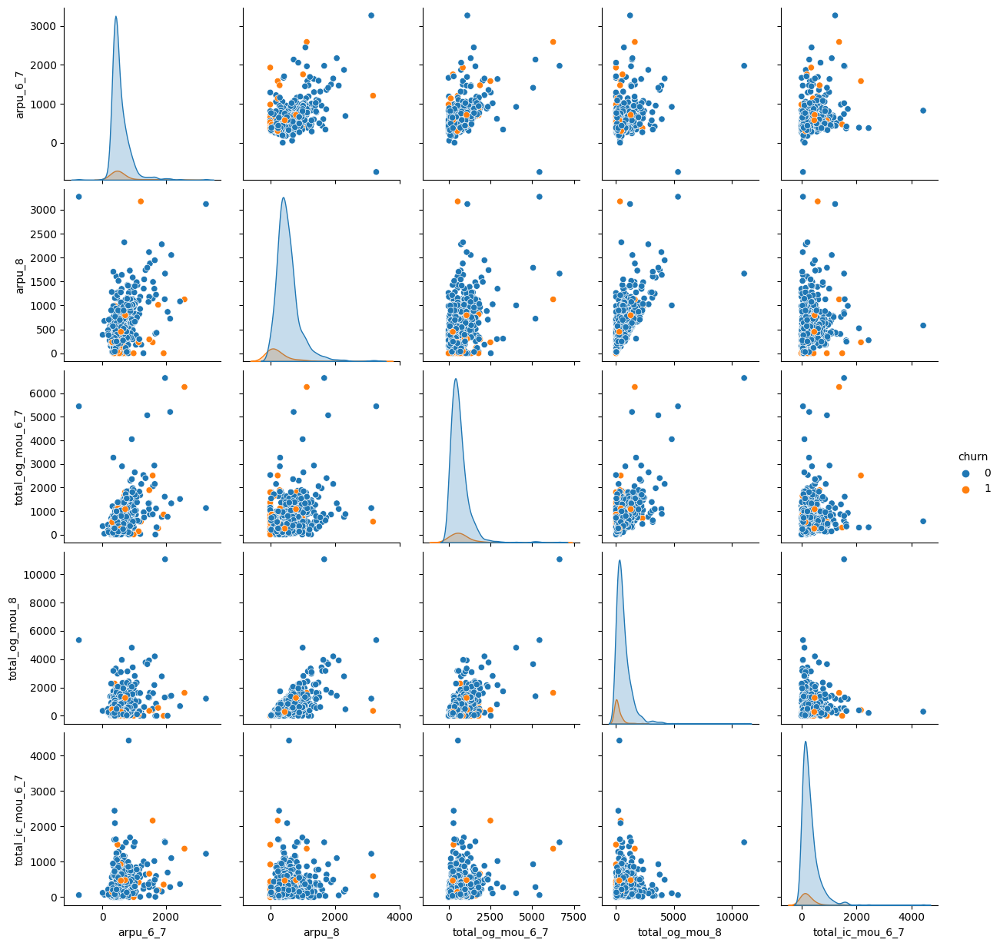

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',vars = col_plot1)
plt.show()

<Figure size 2000x3000 with 0 Axes>

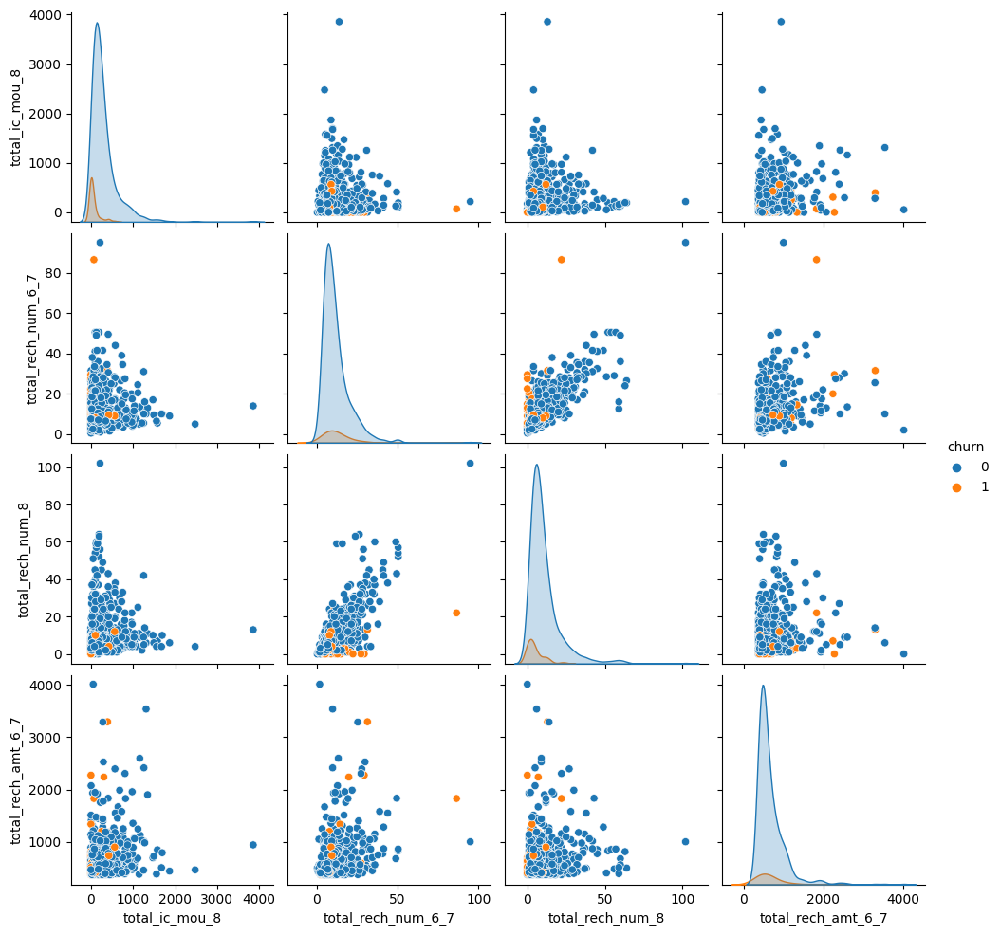

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',vars = col_plot2)
plt.show()

<Figure size 2000x3000 with 0 Axes>

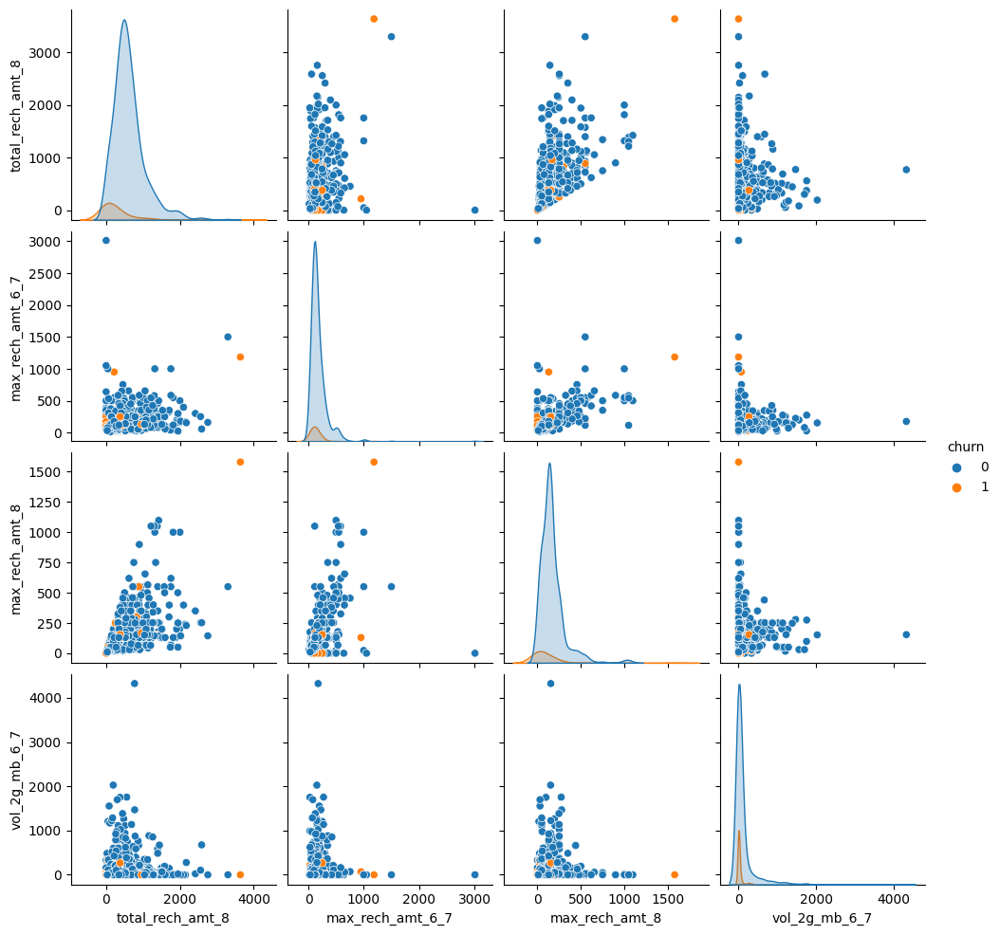

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',vars = col_plot3)
plt.show()

<Figure size 2000x3000 with 0 Axes>

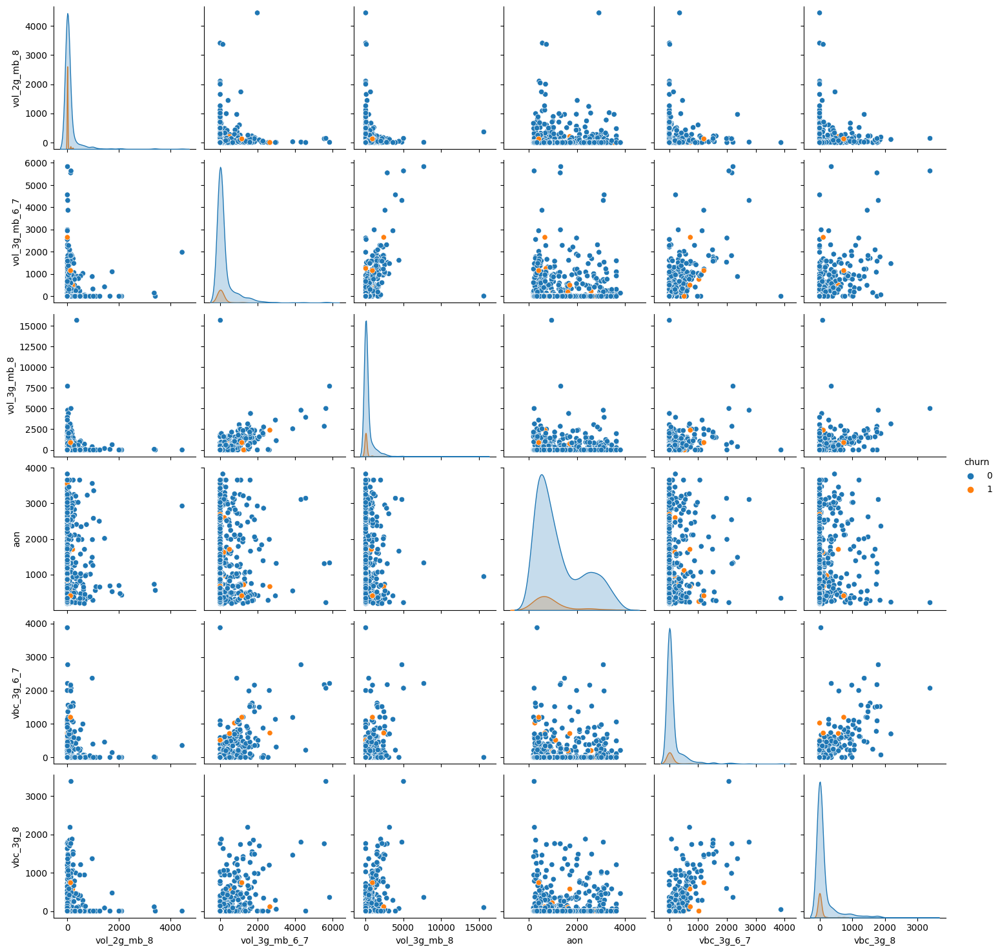

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',vars = col_plot4)
plt.show()

<Figure size 2000x3000 with 0 Axes>

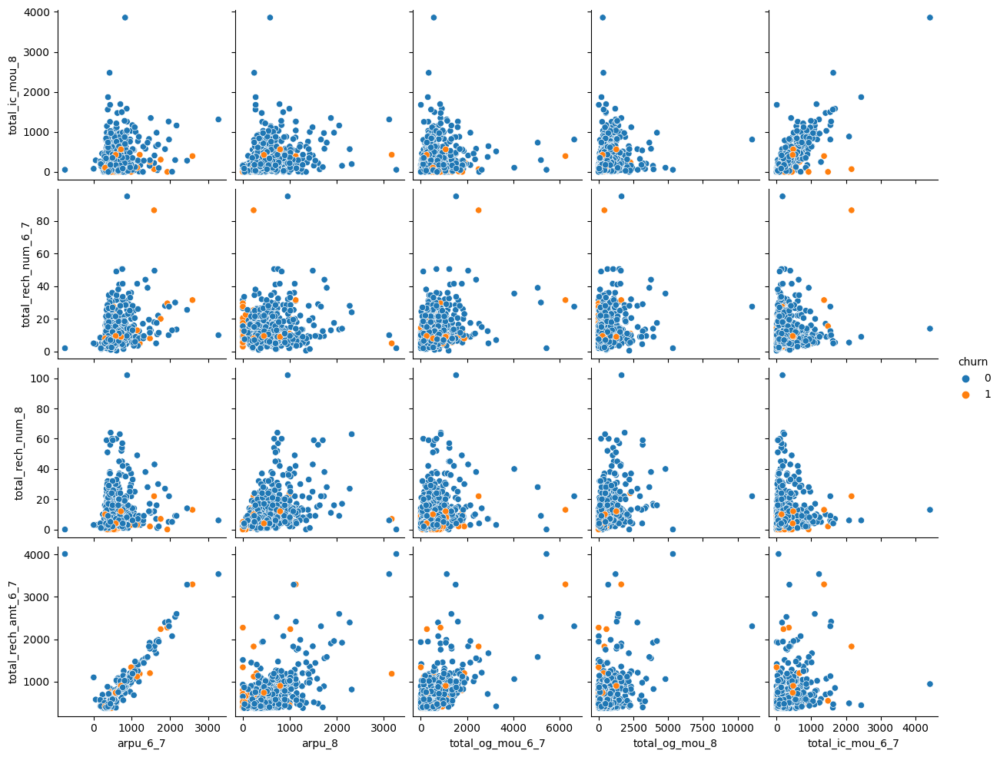

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',x_vars = col_plot1,y_vars = col_plot2)
plt.show()

<Figure size 2000x3000 with 0 Axes>

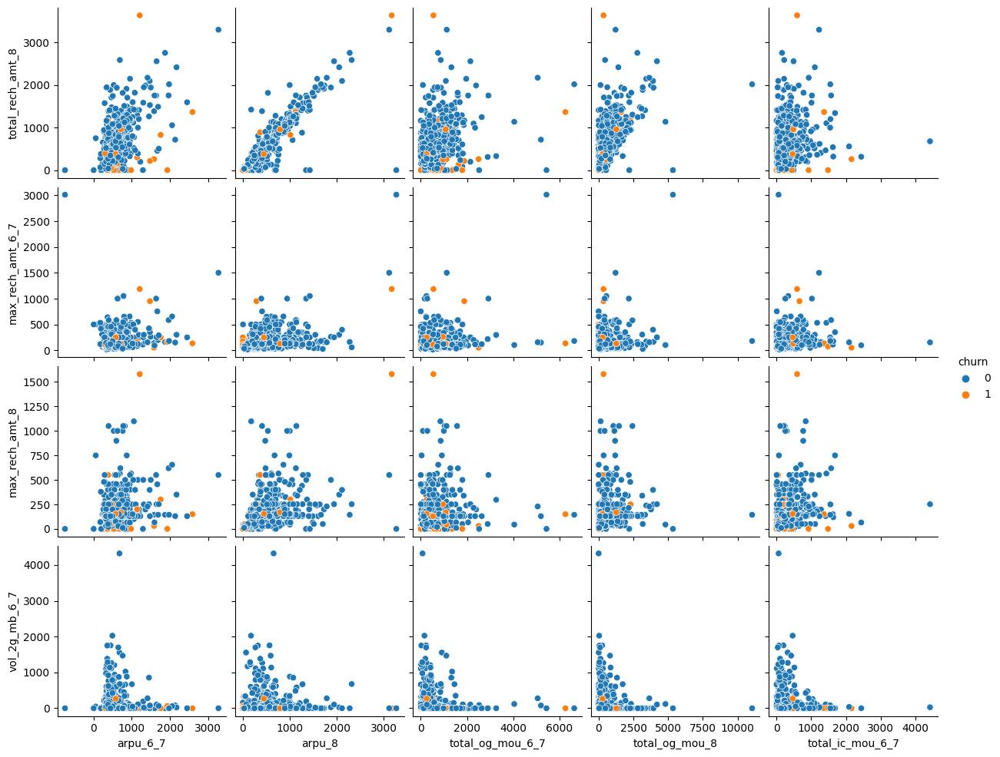

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',x_vars = col_plot1,y_vars = col_plot3)
plt.show()

<Figure size 2000x3000 with 0 Axes>

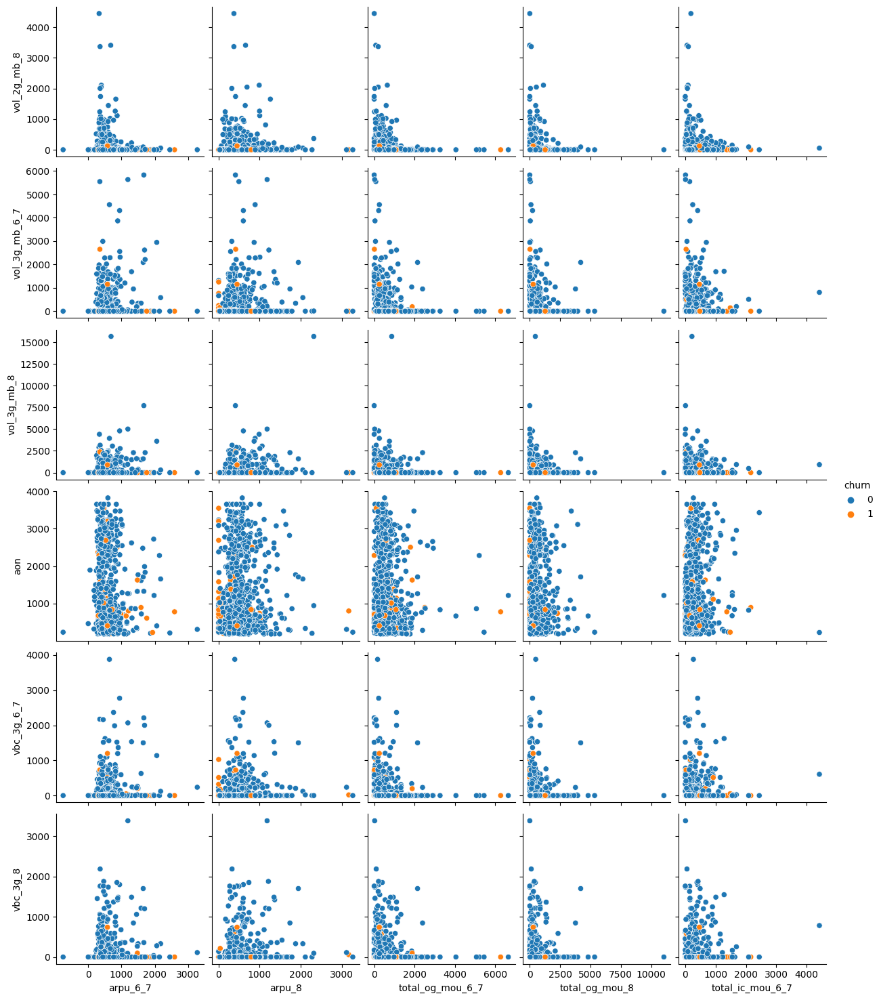

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',x_vars = col_plot1,y_vars = col_plot4)
plt.show()

<Figure size 2000x3000 with 0 Axes>

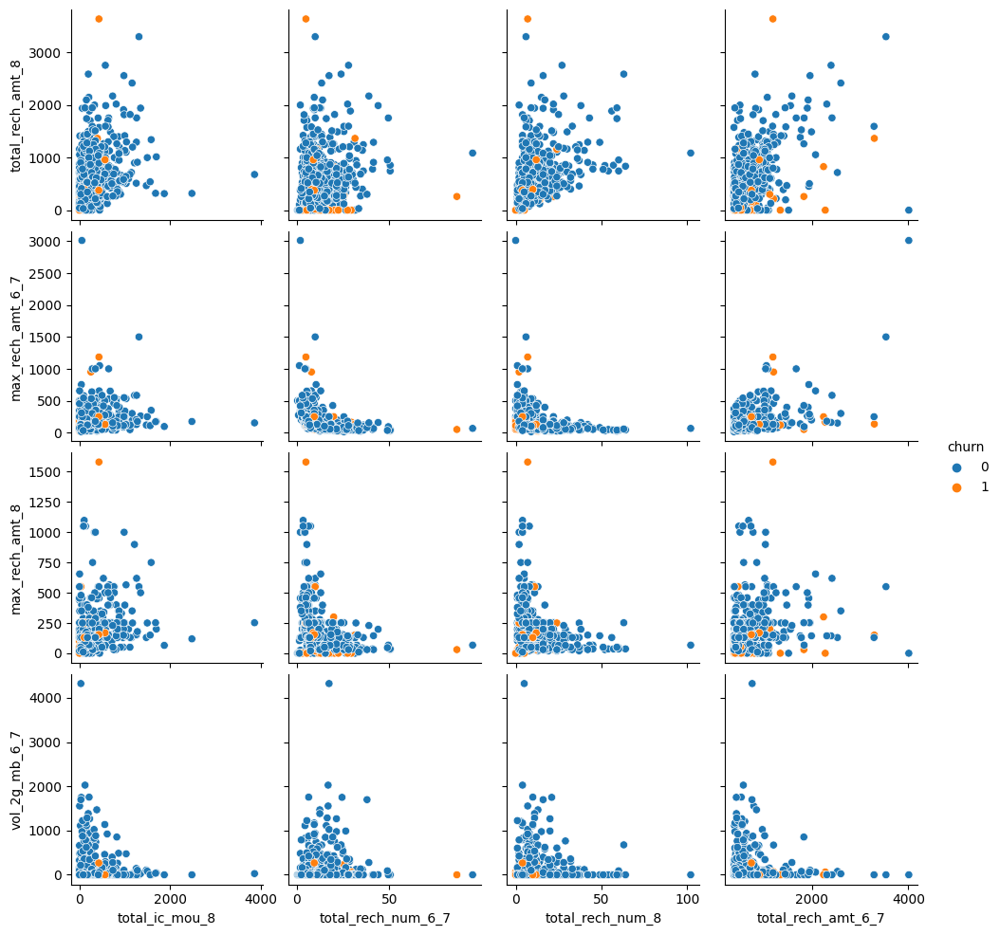

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',x_vars = col_plot2,y_vars = col_plot3)
plt.show()

<Figure size 2000x3000 with 0 Axes>

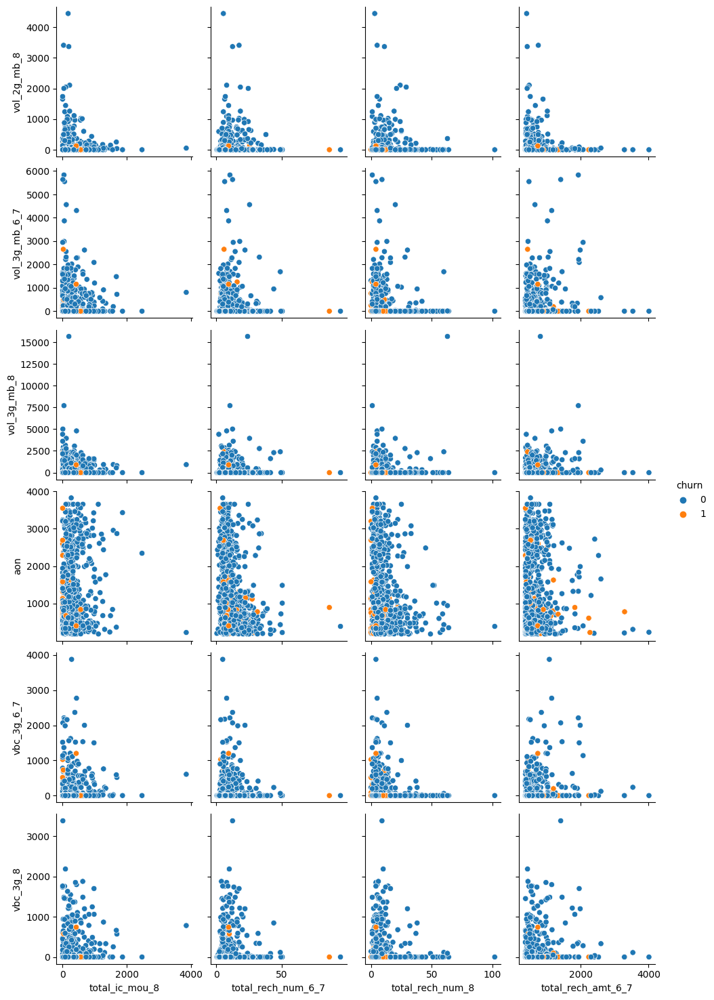

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',x_vars = col_plot2,y_vars = col_plot4)
plt.show()

<Figure size 2000x3000 with 0 Axes>

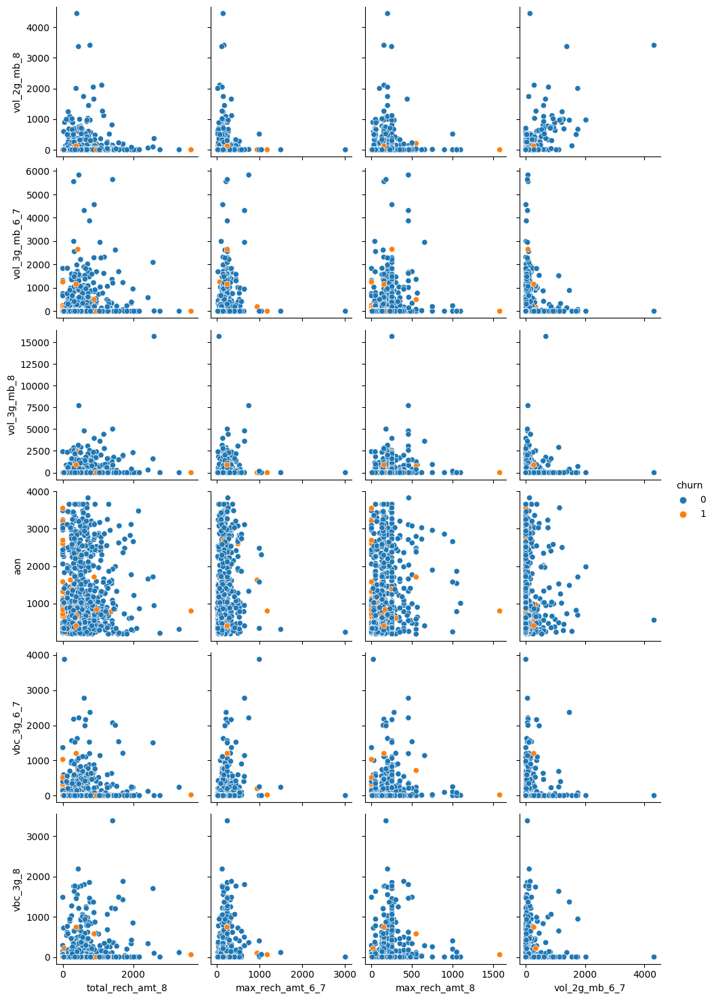

In [ ]:
plt.figure(figsize = [20,30])
sns.pairplot(data = df,hue = 'churn',x_vars = col_plot3,y_vars = col_plot4)
plt.show()

### Checking correlation

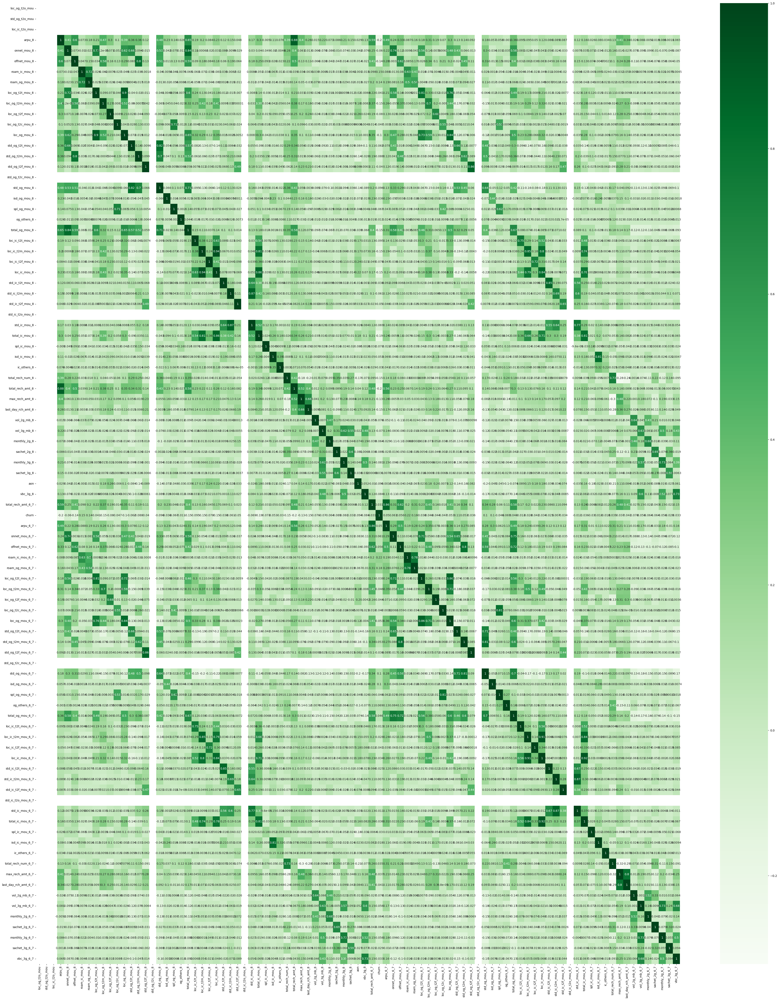

In [ ]:
# plot heatmap
plt.figure(figsize = [50,60])
sns.heatmap(df.corr(),annot = True,cmap = 'Greens')
plt.show()

In [ ]:
df_corr = df.corr()

In [ ]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [ ]:
df_corr['total_rech_amt_6_7']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                  0.590145
onnet_mou_8             0.249806
offnet_mou_8            0.405224
roam_ic_mou_8           0.097695
roam_og_mou_8           0.204373
loc_og_t2t_mou_8        0.215708
loc_og_t2m_mou_8        0.372608
loc_og_t2f_mou_8        0.185891
loc_og_t2c_mou_8        0.013664
loc_og_mou_8            0.352570
std_og_t2t_mou_8        0.114132
std_og_t2m_mou_8        0.194788
std_og_t2f_mou_8        0.114351
std_og_t2c_mou_8             NaN
std_og_mou_8            0.197707
isd_og_mou_8            0.225446
spl_og_mou_8            0.045613
og_others_8             0.019218
total_og_mou_8          0.400336
loc_ic_t2t_mou_8        0.134511
loc_ic_t2m_mou_8        0.161545
loc_ic_t2f_mou_8        0.044914
loc_ic_mou_8            0.174803
std_ic_t2t_mou_8        0.068579
std_ic_t2m_mou_8        0.104829
std_ic_t2f_mou_8        0.023161
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
df_corr['total_rech_amt_8']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                  0.881394
onnet_mou_8             0.398927
offnet_mou_8            0.499772
roam_ic_mou_8           0.039247
roam_og_mou_8           0.141626
loc_og_t2t_mou_8        0.212149
loc_og_t2m_mou_8        0.379538
loc_og_t2f_mou_8        0.254093
loc_og_t2c_mou_8        0.104521
loc_og_mou_8            0.353991
std_og_t2t_mou_8        0.342100
std_og_t2m_mou_8        0.314110
std_og_t2f_mou_8        0.135697
std_og_t2c_mou_8             NaN
std_og_mou_8            0.432501
isd_og_mou_8            0.234821
spl_og_mou_8            0.137643
og_others_8             0.026899
total_og_mou_8          0.583988
loc_ic_t2t_mou_8        0.228652
loc_ic_t2m_mou_8        0.224601
loc_ic_t2f_mou_8        0.112004
loc_ic_mou_8            0.261010
std_ic_t2t_mou_8        0.124378
std_ic_t2m_mou_8        0.162553
std_ic_t2f_mou_8        0.081650
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
df_corr['total_ic_mou_8']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                  0.295299
onnet_mou_8             0.040320
offnet_mou_8            0.245685
roam_ic_mou_8          -0.050672
roam_og_mou_8          -0.072913
loc_og_t2t_mou_8        0.142882
loc_og_t2m_mou_8        0.386377
loc_og_t2f_mou_8        0.204538
loc_og_t2c_mou_8        0.057919
loc_og_mou_8            0.296437
std_og_t2t_mou_8       -0.089508
std_og_t2m_mou_8        0.034812
std_og_t2f_mou_8        0.111323
std_og_t2c_mou_8             NaN
std_og_mou_8           -0.043267
isd_og_mou_8            0.094451
spl_og_mou_8            0.099769
og_others_8            -0.013167
total_og_mou_8          0.180126
loc_ic_t2t_mou_8        0.539813
loc_ic_t2m_mou_8        0.811822
loc_ic_t2f_mou_8        0.358168
loc_ic_mou_8            0.859805
std_ic_t2t_mou_8        0.384263
std_ic_t2m_mou_8        0.415180
std_ic_t2f_mou_8        0.164676
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
df_corr['total_ic_mou_6_7']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                  0.161953
onnet_mou_8             0.034987
offnet_mou_8            0.127584
roam_ic_mou_8          -0.026819
roam_og_mou_8          -0.042759
loc_og_t2t_mou_8        0.178744
loc_og_t2m_mou_8        0.280703
loc_og_t2f_mou_8        0.146796
loc_og_t2c_mou_8        0.027790
loc_og_mou_8            0.279692
std_og_t2t_mou_8       -0.142720
std_og_t2m_mou_8       -0.038831
std_og_t2f_mou_8        0.104369
std_og_t2c_mou_8             NaN
std_og_mou_8           -0.124566
isd_og_mou_8            0.076623
spl_og_mou_8            0.074621
og_others_8            -0.012937
total_og_mou_8          0.104230
loc_ic_t2t_mou_8        0.482794
loc_ic_t2m_mou_8        0.743806
loc_ic_t2f_mou_8        0.291839
loc_ic_mou_8            0.779839
std_ic_t2t_mou_8        0.254867
std_ic_t2m_mou_8        0.193553
std_ic_t2f_mou_8        0.161029
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
df_corr['vol_2g_mb_6_7']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                 -0.025634
onnet_mou_8            -0.074862
offnet_mou_8           -0.106578
roam_ic_mou_8           0.009793
roam_og_mou_8           0.012997
loc_og_t2t_mou_8       -0.012472
loc_og_t2m_mou_8       -0.088616
loc_og_t2f_mou_8       -0.038754
loc_og_t2c_mou_8       -0.003819
loc_og_mou_8           -0.050701
std_og_t2t_mou_8       -0.092786
std_og_t2m_mou_8       -0.073636
std_og_t2f_mou_8       -0.030397
std_og_t2c_mou_8             NaN
std_og_mou_8           -0.110683
isd_og_mou_8           -0.030752
spl_og_mou_8            0.006769
og_others_8            -0.013055
total_og_mou_8         -0.118531
loc_ic_t2t_mou_8       -0.041045
loc_ic_t2m_mou_8       -0.048119
loc_ic_t2f_mou_8       -0.017065
loc_ic_mou_8           -0.053651
std_ic_t2t_mou_8       -0.021538
std_ic_t2m_mou_8       -0.020316
std_ic_t2f_mou_8       -0.025651
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
df_corr['vol_2g_mb_8']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                  0.015150
onnet_mou_8            -0.066305
offnet_mou_8           -0.066221
roam_ic_mou_8           0.036954
roam_og_mou_8           0.079065
loc_og_t2t_mou_8       -0.026499
loc_og_t2m_mou_8       -0.055504
loc_og_t2f_mou_8       -0.023642
loc_og_t2c_mou_8        0.007002
loc_og_mou_8           -0.047786
std_og_t2t_mou_8       -0.067592
std_og_t2m_mou_8       -0.060941
std_og_t2f_mou_8       -0.014243
std_og_t2c_mou_8             NaN
std_og_mou_8           -0.084765
isd_og_mou_8           -0.025555
spl_og_mou_8           -0.008474
og_others_8            -0.010701
total_og_mou_8         -0.097175
loc_ic_t2t_mou_8       -0.042278
loc_ic_t2m_mou_8       -0.040329
loc_ic_t2f_mou_8       -0.008242
loc_ic_mou_8           -0.046397
std_ic_t2t_mou_8       -0.010179
std_ic_t2m_mou_8        0.004824
std_ic_t2f_mou_8        0.001262
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
df_corr['vol_3g_mb_6_7']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                  0.081251
onnet_mou_8            -0.094653
offnet_mou_8           -0.077802
roam_ic_mou_8          -0.007939
roam_og_mou_8          -0.024420
loc_og_t2t_mou_8       -0.015981
loc_og_t2m_mou_8       -0.028969
loc_og_t2f_mou_8        0.004703
loc_og_t2c_mou_8       -0.030443
loc_og_mou_8           -0.026224
std_og_t2t_mou_8       -0.115539
std_og_t2m_mou_8       -0.075246
std_og_t2f_mou_8       -0.006434
std_og_t2c_mou_8             NaN
std_og_mou_8           -0.127709
isd_og_mou_8           -0.019866
spl_og_mou_8           -0.022729
og_others_8            -0.013676
total_og_mou_8         -0.115260
loc_ic_t2t_mou_8       -0.015981
loc_ic_t2m_mou_8        0.018954
loc_ic_t2f_mou_8        0.012704
loc_ic_mou_8            0.012173
std_ic_t2t_mou_8       -0.034063
std_ic_t2m_mou_8        0.061116
std_ic_t2f_mou_8        0.019253
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
df_corr['vol_3g_mb_8']

loc_og_t2o_mou               NaN
std_og_t2o_mou               NaN
loc_ic_t2o_mou               NaN
arpu_8                  0.215348
onnet_mou_8            -0.077674
offnet_mou_8           -0.028269
roam_ic_mou_8          -0.000503
roam_og_mou_8          -0.022791
loc_og_t2t_mou_8       -0.015091
loc_og_t2m_mou_8       -0.026028
loc_og_t2f_mou_8       -0.017952
loc_og_t2c_mou_8       -0.020647
loc_og_mou_8           -0.024985
std_og_t2t_mou_8       -0.092233
std_og_t2m_mou_8       -0.015250
std_og_t2f_mou_8       -0.013549
std_og_t2c_mou_8             NaN
std_og_mou_8           -0.076098
isd_og_mou_8           -0.029892
spl_og_mou_8            0.028139
og_others_8            -0.011164
total_og_mou_8         -0.074090
loc_ic_t2t_mou_8       -0.016417
loc_ic_t2m_mou_8        0.006456
loc_ic_t2f_mou_8        0.027625
loc_ic_mou_8            0.004189
std_ic_t2t_mou_8       -0.014256
std_ic_t2m_mou_8        0.042842
std_ic_t2f_mou_8        0.005549
std_ic_t2o_mou_8             NaN
std_ic_mou

In [ ]:
# drop high correlated variables
df.drop(['arpu_8','arpu_6_7','loc_ic_t2m_mou_8','loc_ic_mou_8','loc_ic_t2m_mou_6_7','loc_ic_mou_6_7',
         'monthly_3g_6_7','vbc_3g_6_7','monthly_3g_8','vbc_3g_8','vol_2g_mb_8'],axis = 1,inplace = True)

In [ ]:
df.columns.values

array(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_t2c_mou_8',
       'std_og_mou_8', 'isd_og_mou_8', 'spl_og_mou_8', 'og_others_8',
       'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2f_mou_8',
       'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8',
       'std_ic_t2o_mou_8', 'std_ic_mou_8', 'total_ic_mou_8',
       'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'total_rech_amt_8', 'max_rech_amt_8', 'last_day_rch_amt_8',
       'vol_3g_mb_8', 'monthly_2g_8', 'sachet_2g_8', 'sachet_3g_8', 'aon',
       'total_rech_amt_6_7', 'churn', 'onnet_mou_6_7', 'offnet_mou_6_7',
       'roam_ic_mou_6_7', 'roam_og_mou_6_7', 'loc_og_t2t_mou_6_7',
       'loc_og_t2m_mou_6_7', 'loc_og_t2f_mou_6_7', 

In [ ]:
pd.reset_option('display.max_columns')
pd.reset_option('display.max_rows')

### Train - Test split

In [ ]:
from sklearn.model_selection import train_test_split

X = df.drop(['churn'],axis = 1)

y = df['churn']

y.head()

7     1
8     0
13    0
16    0
17    0
Name: churn, dtype: int64

In [ ]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,stratify = y,
                                                    random_state=100)

In [ ]:
print(X_train.shape,X_test.shape)

(555, 79) (239, 79)


### Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train[X_train.columns.values] = scaler.fit_transform(X_train[X_train.columns.values])
X_train.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,...,isd_ic_mou_6_7,ic_others_6_7,total_rech_num_6_7,max_rech_amt_6_7,last_day_rch_amt_6_7,vol_2g_mb_6_7,vol_3g_mb_6_7,monthly_2g_6_7,sachet_2g_6_7,sachet_3g_6_7
1355,0.0,0.0,0.0,0.029665,-0.200304,-0.197823,-0.255008,-0.070059,0.397335,-0.111425,...,-0.227203,0.065822,-0.437101,-0.429192,0.046969,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714
1624,0.0,0.0,0.0,-0.331938,-0.011369,1.673899,2.072399,-0.169840,-0.670805,-0.340199,...,1.806280,4.590389,-0.384512,1.197285,1.500791,0.530884,2.338374,-0.361423,-0.093238,1.080675
2029,0.0,0.0,0.0,-0.385448,0.174984,-0.197823,-0.255008,-0.169087,-0.462526,-0.316632,...,-0.227203,-0.183853,0.088785,-0.429192,-0.416569,-0.312170,-0.371855,-0.361423,1.121485,-0.176714
1374,0.0,0.0,0.0,-0.433462,-0.839223,-0.197823,-0.255008,-0.202617,-0.720260,-0.340199,...,-0.227203,-0.218472,-0.647455,-0.757773,-0.374429,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714
2331,0.0,0.0,0.0,0.821676,1.233196,-0.197823,-0.255008,0.079931,0.001330,-0.340199,...,-0.227203,-0.202736,8.713305,-0.711772,-0.795827,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714


In [ ]:
X_train.describe()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,...,isd_ic_mou_6_7,ic_others_6_7,total_rech_num_6_7,max_rech_amt_6_7,last_day_rch_amt_6_7,vol_2g_mb_6_7,vol_3g_mb_6_7,monthly_2g_6_7,sachet_2g_6_7,sachet_3g_6_7
count,555.0,555.0,555.0,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,...,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02,5.550000e+02
mean,0.0,0.0,0.0,-5.121029e-17,-5.121029e-17,-3.200643e-18,4.480900e-17,9.601929e-18,-1.280257e-16,-6.401286e-18,...,-4.160836e-17,3.200643e-18,-3.200643e-17,-7.681543e-17,3.840772e-17,-1.280257e-17,2.320466e-17,-2.880579e-17,-9.601929e-18,-3.520707e-17
std,0.0,0.0,0.0,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,...,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00,1.000902e+00
min,0.0,0.0,0.0,-4.334617e-01,-8.429340e-01,-1.978229e-01,-2.550078e-01,-2.026165e-01,-7.202597e-01,-3.401988e-01,...,-2.272034e-01,-2.184715e-01,-1.225929e+00,-9.877800e-01,-8.801062e-01,-3.121696e-01,-3.718548e-01,-3.614227e-01,-3.361829e-01,-1.767141e-01
25%,0.0,0.0,0.0,-3.863360e-01,-6.312314e-01,-1.978229e-01,-2.550078e-01,-1.865575e-01,-5.918746e-01,-3.401988e-01,...,-2.272034e-01,-2.184715e-01,-6.474550e-01,-4.965512e-01,-6.188396e-01,-3.121696e-01,-3.718548e-01,-3.614227e-01,-3.361829e-01,-1.767141e-01
50%,0.0,0.0,0.0,-2.847357e-01,-2.494496e-01,-1.978229e-01,-2.550078e-01,-1.487539e-01,-3.400362e-01,-3.401988e-01,...,-2.272034e-01,-2.184715e-01,-2.793352e-01,-3.306177e-01,-2.142978e-01,-3.121696e-01,-3.718548e-01,-3.614227e-01,-3.361829e-01,-1.767141e-01
75%,0.0,0.0,0.0,-3.451452e-03,2.561367e-01,-1.978229e-01,-2.550078e-01,-4.953833e-02,2.173850e-01,-9.533025e-02,...,-1.927015e-01,-1.770339e-01,2.728445e-01,1.819688e-01,1.818160e-01,-1.638625e-01,-2.730104e-01,-3.614227e-01,-9.323823e-02,-1.767141e-01
max,0.0,0.0,0.0,1.602923e+01,8.128312e+00,1.205959e+01,1.121042e+01,2.004068e+01,1.143038e+01,1.343280e+01,...,1.587972e+01,1.426581e+01,8.713305e+00,8.705363e+00,9.654837e+00,1.492389e+01,8.226343e+00,9.190463e+00,9.624549e+00,1.868412e+01


In [ ]:
# scaling test data
X_test[X_test.columns.values] = scaler.transform(X_test[X_test.columns.values])
X_test.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,...,isd_ic_mou_6_7,ic_others_6_7,total_rech_num_6_7,max_rech_amt_6_7,last_day_rch_amt_6_7,vol_2g_mb_6_7,vol_3g_mb_6_7,monthly_2g_6_7,sachet_2g_6_7,sachet_3g_6_7
1304,0.0,0.0,0.0,-0.190500,-0.085288,-0.197823,-0.255008,0.096141,0.563729,0.781253,...,-0.227203,-0.218472,-0.805221,-0.251758,-0.340717,-0.267356,-0.371855,1.003132,-0.336183,-0.176714
345,0.0,0.0,0.0,-0.433462,-0.702192,-0.184621,0.479554,-0.202617,-0.720260,-0.340199,...,-0.227203,-0.218472,-0.016392,-0.843204,-0.568272,0.854260,-0.371855,1.003132,1.121485,-0.176714
1364,0.0,0.0,0.0,-0.194909,0.520583,-0.197823,-0.255008,-0.054000,1.418911,-0.340199,...,-0.227203,-0.218472,-0.016392,-0.429192,-0.880106,-0.312170,-0.371855,-0.361423,2.093264,-0.176714
552,0.0,0.0,0.0,1.084940,4.094403,-0.197823,-0.255008,0.092922,0.185937,-0.340199,...,-0.227203,0.873593,-0.331924,-0.363476,-0.205870,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714
2489,0.0,0.0,0.0,-0.340129,-0.203062,-0.197823,-0.255008,-0.087850,0.269799,-0.340199,...,-0.208149,-0.163921,-0.594866,-0.297760,-0.416569,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714


In [ ]:
X_test.describe()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,...,isd_ic_mou_6_7,ic_others_6_7,total_rech_num_6_7,max_rech_amt_6_7,last_day_rch_amt_6_7,vol_2g_mb_6_7,vol_3g_mb_6_7,monthly_2g_6_7,sachet_2g_6_7,sachet_3g_6_7
count,239.0,239.0,239.0,239.000000,239.000000,239.000000,239.000000,239.000000,239.000000,239.000000,...,239.000000,239.000000,239.000000,239.000000,239.000000,239.000000,239.000000,239.000000,239.000000,239.000000
mean,0.0,0.0,0.0,-0.038913,0.111367,-0.061663,0.018172,-0.059882,0.135133,-0.023272,...,-0.062711,-0.124570,-0.065901,0.017307,0.012446,0.121105,-0.081570,0.106751,-0.043429,-0.105690
std,0.0,0.0,0.0,0.724353,1.132582,0.632123,1.401712,0.291879,1.176592,0.888581,...,0.709821,0.432648,0.729972,1.487141,1.743250,1.055929,0.709927,1.015709,0.952831,0.325890
min,0.0,0.0,0.0,-0.433462,-0.842934,-0.197823,-0.255008,-0.202617,-0.720260,-0.340199,...,-0.227203,-0.218472,-1.068163,-1.053496,-0.880106,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714
25%,0.0,0.0,0.0,-0.386336,-0.585747,-0.197823,-0.255008,-0.187235,-0.555518,-0.340199,...,-0.227203,-0.218472,-0.594866,-0.429192,-0.618840,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714
50%,0.0,0.0,0.0,-0.306599,-0.206071,-0.197823,-0.255008,-0.144669,-0.255945,-0.340199,...,-0.227203,-0.218472,-0.279335,-0.337189,-0.290149,-0.312170,-0.371855,-0.361423,-0.336183,-0.176714
75%,0.0,0.0,0.0,-0.054818,0.384455,-0.197823,-0.255008,-0.068647,0.322098,-0.115449,...,-0.217121,-0.204834,0.246550,0.162254,0.173388,-0.049933,-0.361152,-0.361423,-0.214711,-0.176714
max,0.0,0.0,0.0,5.618145,8.424314,7.447088,16.869759,2.186484,8.715551,9.148747,...,5.754756,5.293255,3.086331,18.628513,24.488036,6.831180,3.971615,3.732243,10.596328,2.966757


## PCA - reducing variables

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(random_state=42)

pca.fit(X_train)

PCA(random_state=42)

In [ ]:
# components from the PCA
pca.components_

array([[-6.17340147e-19,  5.55111512e-17,  1.11022302e-16, ...,
        -3.24339756e-02, -9.95308098e-03, -3.09726143e-02],
       [ 4.70899558e-20, -1.38777878e-17,  0.00000000e+00, ...,
         1.13848438e-01, -5.04290987e-02, -8.76218238e-03],
       [ 1.26579021e-18, -5.55111512e-17, -2.22044605e-16, ...,
         1.94322068e-03, -2.36351038e-02,  1.02831425e-02],
       ...,
       [ 0.00000000e+00, -5.97315097e-01,  3.90966857e-01, ...,
        -1.31838984e-16, -5.55111512e-17, -6.93889390e-17],
       [ 0.00000000e+00,  3.46239817e-03, -1.16841109e-03, ...,
         1.08420217e-18, -3.79470760e-19,  2.16840434e-19],
       [ 9.99996811e-01, -1.31325313e-03, -2.14519933e-03, ...,
         6.91178885e-19,  1.51788304e-18, -1.89735380e-18]])

In [ ]:
# explained variance ration for each component
pca.explained_variance_ratio_

array([1.15429536e-01, 8.32673288e-02, 7.51383720e-02, 5.08327450e-02,
       4.70681401e-02, 4.46732338e-02, 4.22726000e-02, 3.70643205e-02,
       3.37209547e-02, 3.08740898e-02, 2.91316759e-02, 2.84025810e-02,
       2.50961789e-02, 2.16637848e-02, 2.10677416e-02, 1.92455822e-02,
       1.84412052e-02, 1.77771979e-02, 1.68937741e-02, 1.42970124e-02,
       1.38936070e-02, 1.33946640e-02, 1.25640189e-02, 1.19609925e-02,
       1.17346676e-02, 1.13262487e-02, 1.06281518e-02, 1.03642696e-02,
       9.55081194e-03, 9.16508946e-03, 8.53225524e-03, 8.18677361e-03,
       7.72352194e-03, 7.08983903e-03, 6.44123243e-03, 6.22635408e-03,
       5.55607249e-03, 5.35908065e-03, 5.33205556e-03, 5.04372955e-03,
       4.56387955e-03, 4.27035459e-03, 4.21412984e-03, 4.00603439e-03,
       3.52948478e-03, 3.33722283e-03, 3.11249644e-03, 2.86340479e-03,
       2.58435078e-03, 2.30620029e-03, 2.12486814e-03, 1.79899639e-03,
       1.50950708e-03, 1.47117141e-03, 1.38547763e-03, 1.25181793e-03,
      

### Making a scree plot for explained variance

In [ ]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

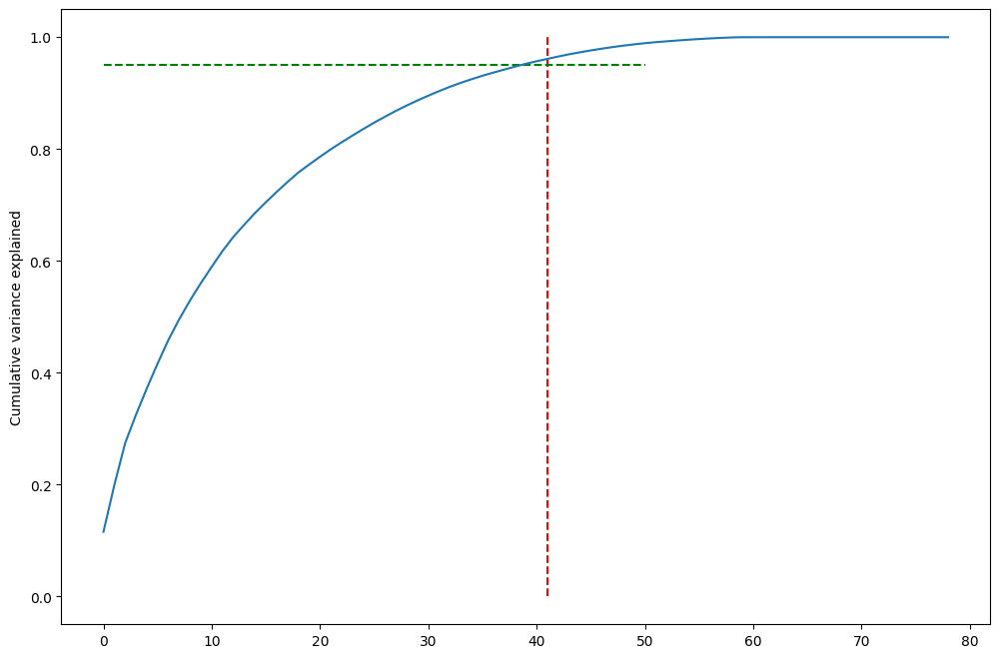

In [ ]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=41, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=50, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [ ]:
# selecting variables which explains 95% of the data
from sklearn.decomposition import IncrementalPCA

# selecting 41 features
pca_final = IncrementalPCA(n_components=41)

df_train_pca = pca_final.fit_transform(X_train)

df_train_pca.shape

(555, 41)

In [ ]:
corrmat = np.corrcoef(df_train_pca.transpose())

In [ ]:
corrmat.shape

(41, 41)

### Plotting the heatmap of the correlation matrix

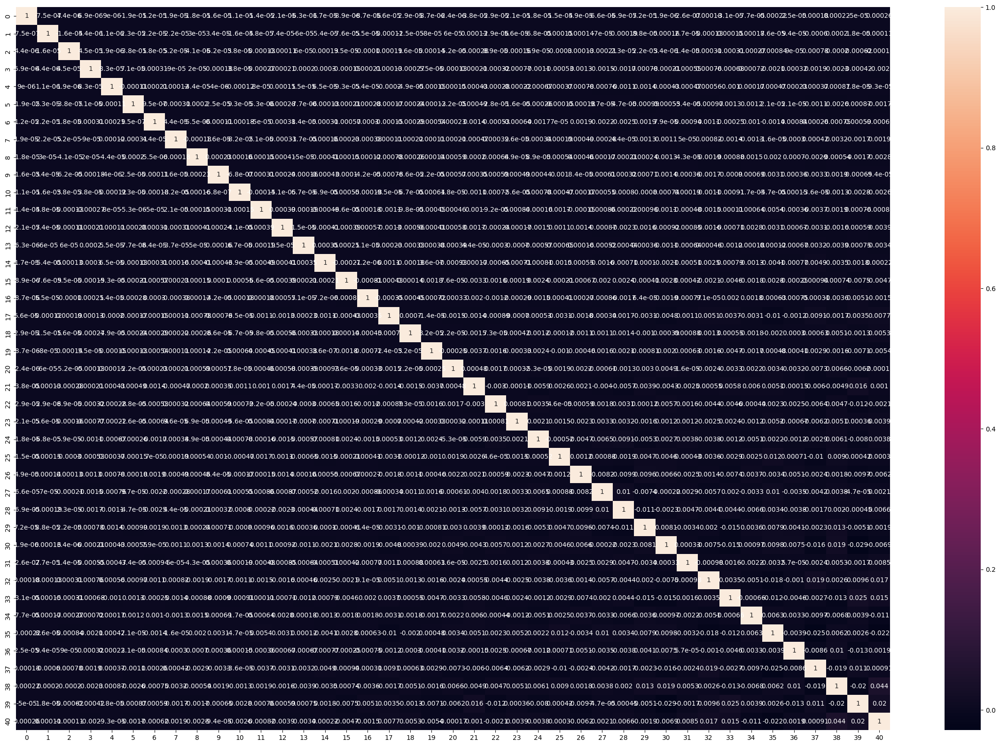

In [ ]:
plt.figure(figsize=[30,20])
sns.heatmap(corrmat, annot=True);

#### Features selected using PCA has no correlation with each other

In [ ]:
# applying PCA on test data
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(239, 41)

### Objective 1 - Build Random Forest model to predict churning customers

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf = RandomForestClassifier(random_state=42,n_jobs=-1)

In [ ]:
# parameters for hyper parameter tuning
# max_depth: maximum depth of a tree in random forest
# min_samles_leaf: minumum number of samples in the leaf that should be maintained after splitting
# n_estimators: number of trees in the random forest
params = {
    'max_depth':[10,20,25,30,35], # model was overfitting with higher values
    'min_samples_leaf':[80,90,100], # with values such as 2,5,10,15,20 model was overfitting
    'n_estimators': [10,25,50,100]
}

In [ ]:
# params = {
#     'max_depth':[50,55,60,65],
#     'min_samples_leaf':[50,60,70,80],
#     'n_estimators': [50,100,150,200]
# }

### Hyperparameter tuning for the random forest

In [ ]:
# gridsearch is used for hyper parameter tuning
grid_search_os = GridSearchCV(estimator=rf, param_grid = params, cv=4, n_jobs=-1,verbose = 1,
                          scoring='accuracy')

In [ ]:
%%time
grid_search_os.fit(df_train_pca,y_train)

Fitting 4 folds for each of 60 candidates, totalling 240 fits
CPU times: user 401 ms, sys: 75.8 ms, total: 477 ms
Wall time: 16.1 s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 25, 30, 35],
                         'min_samples_leaf': [80, 90, 100],
                         'n_estimators': [10, 25, 50, 100]},
             scoring='accuracy', verbose=1)

In [ ]:
grid_search_os.best_score_

0.9207199457825045

In [ ]:
rf_best_os = grid_search_os.best_estimator_
rf_best_os

RandomForestClassifier(max_depth=10, min_samples_leaf=80, n_estimators=10,
                       n_jobs=-1, random_state=42)

In [ ]:
# define function to plot ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import RocCurveDisplay

# defining a function to evaluate training data
# model: 1 (random forest)
# model: 0 (logistic regression)

def model_eval_train_data(model_best,xtrain,ytrain,model=1,cutoff = 0.1):

    if model == 1:
        # prediction probability of target variable
        y_train_pred_proba = model_best.predict_proba(xtrain)
        # creating a dataframe for evaluation
        y_train_pred_final = pd.DataFrame({'Churn':ytrain.values, 'Churn_Prob':y_train_pred_proba[:,1]})
    else:
        # prediction probability of target variable
        y_train_pred_proba = model_best.predict(xtrain)
        # creating a dataframe for evaluation
        y_train_pred_final = pd.DataFrame({'Churn':ytrain.values, 'Churn_Prob':y_train_pred_proba})



    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        # predicting Churn for multiple probability cutoff
        y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)

    # Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
    cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

    # TP = confusion[1,1] # true positive
    # TN = confusion[0,0] # true negatives
    # FP = confusion[0,1] # false positives
    # FN = confusion[1,0] # false negatives

    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
        cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
        total1=sum(sum(cm1))
        accuracy = (cm1[0,0]+cm1[1,1])/total1

        speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
        sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
        cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]

    # plot accuracy sensitivity and specificity curve
    cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
    plt.show()

    # plot precision recall curve
    p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)
    plt.plot(thresholds, p[:-1], "g-")
    plt.plot(thresholds, r[:-1], "r-")
    plt.show()

    # final predicition based on the cutoff chosen
    y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > cutoff else 0)

    # Plot ROC curve
    if model == 1:
        RocCurveDisplay.from_estimator(model_best,xtrain,ytrain)
        plt.show()
    else:
        draw_roc(y_train_pred_final['Churn'],y_train_pred_final['Churn_Prob'])

    print(cutoff_df)

    # Let's check the overall accuracy, precision and recall.
    print('\n\n************************ Metrics Evaluation based on chosen cutoff of ',cutoff,'************************')
    print('\n\naccuracy score:',metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted))
    print('precision score:',metrics.precision_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted))
    print('recall score:',metrics.recall_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted))


In [ ]:
# defining a function to evaluate test data
# model: 1 (random forest)
# model: 0 (logistic regression)

def model_eval_test_data(model_best,xtest,ytest,model = 1,cutoff = 0.1):
    if model == 1:
        # prediction probability of target variable
        y_test_pred_proba = model_best.predict_proba(xtest)
        # creating a dataframe for evaluation
        y_test_pred_final = pd.DataFrame({'Churn':ytest, 'Churn_Prob':y_test_pred_proba[:,1]})
    else:
        # prediction probability of target variable
        y_test_pred_proba = model_best.predict(xtest)
        # creating a dataframe for evaluation
        y_test_pred_final = pd.DataFrame({'Churn':ytest, 'Churn_Prob':y_test_pred_proba})

    y_test_pred_final['final_predicted'] = y_test_pred_final.Churn_Prob.map( lambda x: 1 if x > cutoff else 0)

    # Let's check the overall accuracy.
    print('accuracy score',metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.final_predicted))
    print('precision score',metrics.precision_score(y_test_pred_final.Churn, y_test_pred_final.final_predicted))
    print('recall score',metrics.recall_score(y_test_pred_final.Churn, y_test_pred_final.final_predicted))

#     # Let's create columns with different probability cutoffs
#     numbers = [float(x)/10 for x in range(10)]
#     y_test_pred_final1 = y_test_pred_final[:]
#     for i in numbers:
#         y_test_pred_final1[i]= y_test_pred_final1.Churn_Prob.map(lambda x: 1 if x > i else 0)

#     # Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
#     cutoff_df1 = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

#     # TP = confusion[1,1] # true positive
#     # TN = confusion[0,0] # true negatives
#     # FP = confusion[0,1] # false positives
#     # FN = confusion[1,0] # false negatives

#     num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#     for i in num:
#         cm1 = metrics.confusion_matrix(y_test_pred_final1.Churn, y_test_pred_final1[i] )
#         total1=sum(sum(cm1))
#         accuracy = (cm1[0,0]+cm1[1,1])/total1

#         speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
#         sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
#         cutoff_df1.loc[i] =[ i ,accuracy,sensi,speci]
#     print('\n',cutoff_df1)


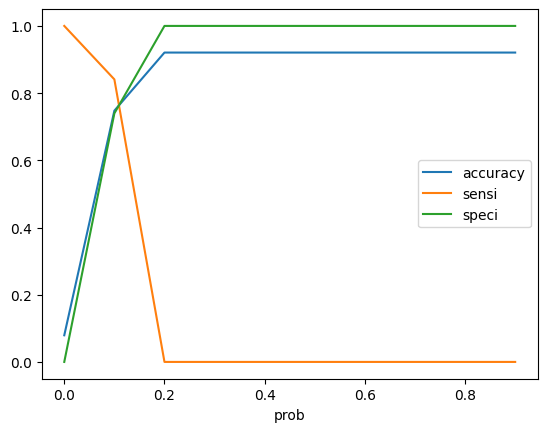

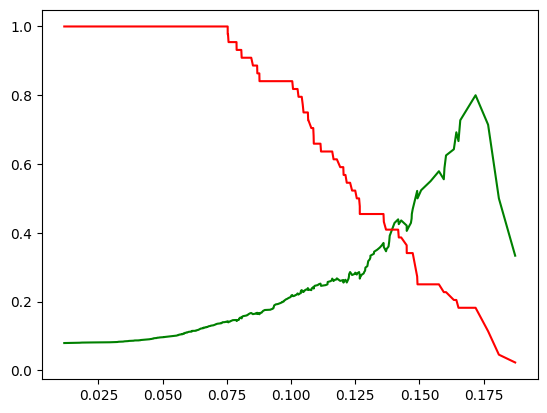

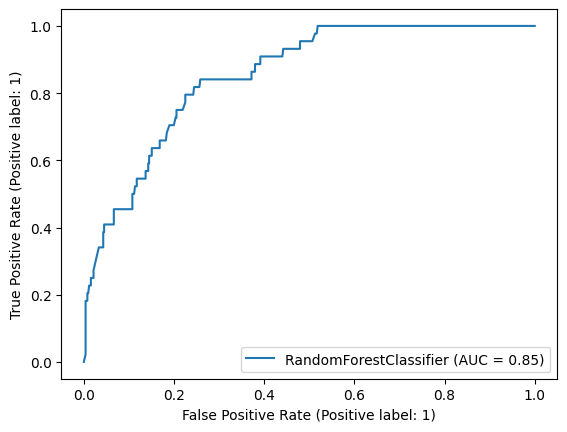

     prob  accuracy     sensi     speci
0.0   0.0  0.079279  1.000000  0.000000
0.1   0.1  0.747748  0.840909  0.739726
0.2   0.2  0.920721  0.000000  1.000000
0.3   0.3  0.920721  0.000000  1.000000
0.4   0.4  0.920721  0.000000  1.000000
0.5   0.5  0.920721  0.000000  1.000000
0.6   0.6  0.920721  0.000000  1.000000
0.7   0.7  0.920721  0.000000  1.000000
0.8   0.8  0.920721  0.000000  1.000000
0.9   0.9  0.920721  0.000000  1.000000


************************ Metrics Evaluation based on chosen cutoff of  0.2 ************************


accuracy score: 0.9207207207207208
precision score: 0.0
recall score: 0.0


In [ ]:
# evaluating train data
model_eval_train_data(rf_best_os,df_train_pca,y_train,1,0.2)

In [ ]:
model_eval_test_data(rf_best_os,df_test_pca,y_test,1,0.2)

accuracy score 0.9205020920502092
precision score 0.0
recall score 0.0


### Since finding churning customers is the main goal (Positives), Recall is the metrics that should be considered for evaluation

### Recall - Sensitivity score is very less with probability cutoff of 0.2, let's handle class imbalance with below techniques

## Handling class imbalance

### Technique 1 - SMOTE

In [ ]:
# SMOTE
from imblearn.over_sampling import SMOTE
smt = SMOTE(random_state=45, k_neighbors=5)
X_resampled_smt, y_resampled_smt = smt.fit_resample(df_train_pca, y_train)

y_resampled_smt.value_counts(normalize = True) * 100

0    50.0
1    50.0
Name: churn, dtype: float64

In [ ]:
# hyper parameter tuning
grid_search_smt = GridSearchCV(estimator=rf, param_grid = params, cv=4, n_jobs=-1,verbose = 1,
                          scoring='accuracy')

grid_search_smt.fit(X_resampled_smt,y_resampled_smt)

print(grid_search_smt.best_score_)

rf_best_smt = grid_search_smt.best_estimator_
print(rf_best_smt)

Fitting 4 folds for each of 60 candidates, totalling 240 fits
0.8493221507352942
RandomForestClassifier(max_depth=10, min_samples_leaf=80, n_estimators=50,
                       n_jobs=-1, random_state=42)


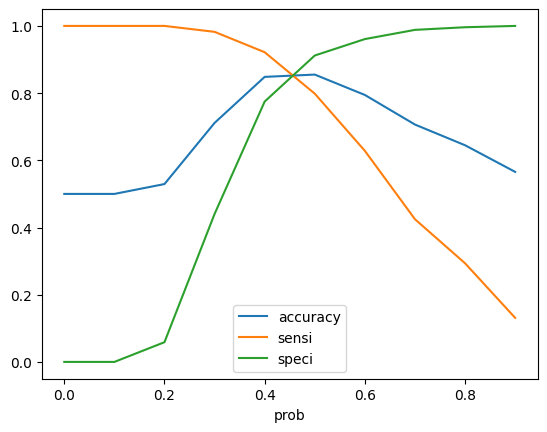

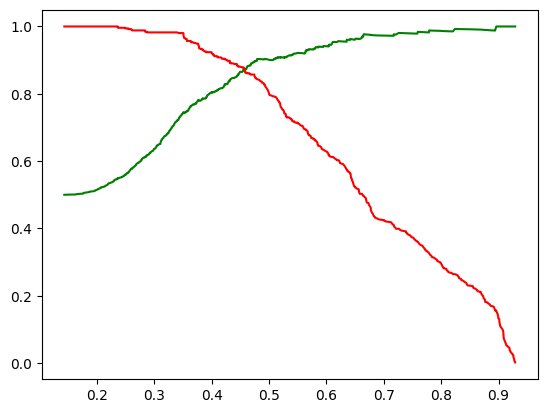

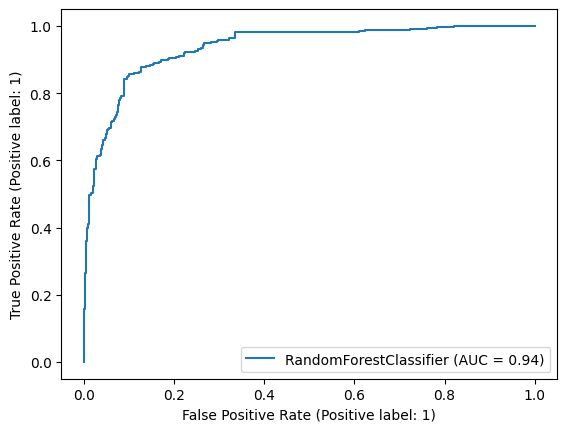

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.500000  1.000000  0.000000
0.2   0.2  0.529354  1.000000  0.058708
0.3   0.3  0.711350  0.982387  0.440313
0.4   0.4  0.848337  0.921722  0.774951
0.5   0.5  0.855186  0.798434  0.911937
0.6   0.6  0.794521  0.628180  0.960861
0.7   0.7  0.706458  0.424658  0.988258
0.8   0.8  0.644814  0.293542  0.996086
0.9   0.9  0.565558  0.131115  1.000000


************************ Metrics Evaluation based on chosen cutoff of  0.2 ************************


accuracy score: 0.5293542074363993
precision score: 0.5151209677419355
recall score: 1.0


In [ ]:
# evaluating train data
model_eval_train_data(rf_best_smt,X_resampled_smt,y_resampled_smt,1,0.2)

### Probability value of 0.2 can be chosen as cutoff to distinguish between churn and non-churn

In [ ]:
# evaluating test data
model_eval_test_data(rf_best_smt,df_test_pca,y_test,1,0.2)

accuracy score 0.1589958158995816
precision score 0.08636363636363636
recall score 1.0


### Technique 2 - ADASYN

In [ ]:
from imblearn.over_sampling import ADASYN
ada = ADASYN(random_state=45, n_neighbors=5)

X_resampled_ada, y_resampled_ada = ada.fit_resample(df_train_pca, y_train)

y_resampled_ada.value_counts(normalize = True) * 100

1    50.146341
0    49.853659
Name: churn, dtype: float64

In [ ]:
# hyper parameter tuning
grid_search_ada = GridSearchCV(estimator=rf, param_grid = params, cv=4, n_jobs=-1,verbose = 1,
                          scoring='accuracy')

grid_search_ada.fit(X_resampled_ada,y_resampled_ada)

print(grid_search_ada.best_score_)

rf_best_ada = grid_search_ada.best_estimator_
print(rf_best_ada)

Fitting 4 folds for each of 60 candidates, totalling 240 fits
0.8048432940175098
RandomForestClassifier(max_depth=10, min_samples_leaf=100, n_jobs=-1,
                       random_state=42)


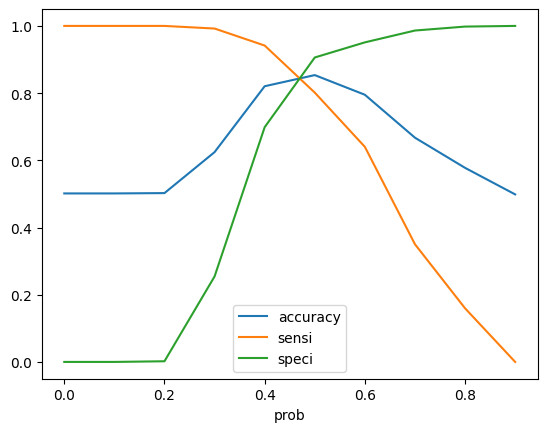

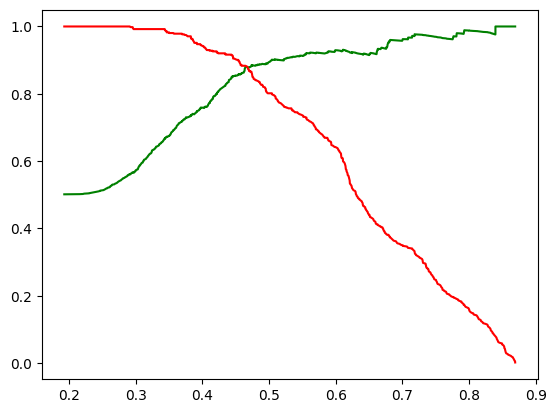

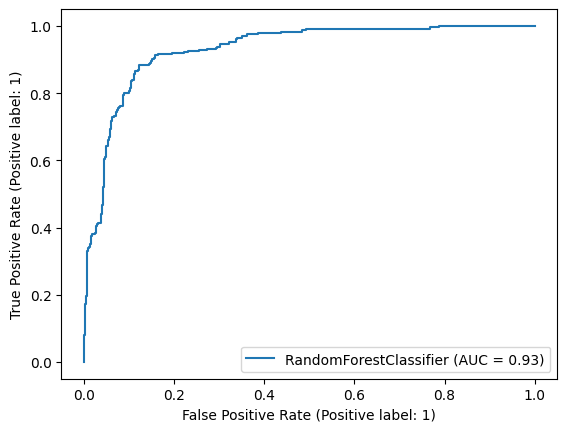

     prob  accuracy     sensi     speci
0.0   0.0  0.501463  1.000000  0.000000
0.1   0.1  0.501463  1.000000  0.000000
0.2   0.2  0.502439  1.000000  0.001957
0.3   0.3  0.624390  0.992218  0.254403
0.4   0.4  0.820488  0.941634  0.698630
0.5   0.5  0.853659  0.801556  0.906067
0.6   0.6  0.795122  0.640078  0.951076
0.7   0.7  0.667317  0.350195  0.986301
0.8   0.8  0.577561  0.159533  0.998043
0.9   0.9  0.498537  0.000000  1.000000


************************ Metrics Evaluation based on chosen cutoff of  0.2 ************************


accuracy score: 0.5024390243902439
precision score: 0.501953125
recall score: 1.0


In [ ]:
# evaluating train data
model_eval_train_data(rf_best_ada,X_resampled_ada,y_resampled_ada,1,0.2)

In [ ]:
# evaluating test data
model_eval_test_data(rf_best_ada,df_test_pca,y_test,1,0.2)

accuracy score 0.0794979079497908
precision score 0.0794979079497908
recall score 1.0


#### Model built using ADASYN is performing better in both test and train data when compared to other methods this model can be  used for prediction of churning customers

## Objective 2 - Build logistic regression model to understand important variables influencing churn

### 1st model

In [ ]:
import statsmodels.api as sm

In [ ]:
# handle class imbalance using ADASYN
ada_lr = ADASYN(random_state=45, n_neighbors=5)

X_resampled_ada_lr, y_resampled_ada_lr = ada_lr.fit_resample(X_train, y_train)

y_resampled_ada_lr.value_counts(normalize = True) * 100

1    50.048876
0    49.951124
Name: churn, dtype: float64

In [ ]:
# Logistic regression model
logm1 = sm.GLM(y_resampled_ada_lr,(sm.add_constant(X_resampled_ada_lr)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                 1023
Model:                            GLM   Df Residuals:                      950
Model Family:                Binomial   Df Model:                           72
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 16 Jan 2024   Deviance:                       6539.3
Time:                        14:09:49   Pearson chi2:                 3.20e+17
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -2.317e+15   2.52e+06  -9.18e+08      0.000   -2.32e+15   -2.32e+15
loc_og_t2o_mou        1.871e+07      0.991   1.89e+07      0.000    1.87e+07    1.87e+07
std_og_t2o_mou         -6.7e+08      7.530   -8.9e+07      0.000    -6.7e+08    -6.7e+08
loc_ic_t2o_mou        1.869e+08      2.825   6.62e+07      0.000    1.87e+08    1.87e+08
onnet_mou_8           5.018e+15   4.02e+08   1.25e+07      0.000    5.02e+15    5.02e+15
offnet_mou_8          9.223e+14   2.48e+08   3.72e+06      0.000    9.22e+14    9.22e+14
roam_ic_mou_8         9.851e+13   4.69e+06    2.1e+07      0.000    9.85e+13    9.85e+13
roam_og_mou_8         -3.87e+14    4.7e+07  -8.23e+06      0.000   -3.87e+14   -3.87e+14
loc_og_t2t_mou_8     -1.332e+19   2.59e+11  -5.14e+07      0.000   -1.33e+19   -1.33e+19
loc_og_t2m_mou_8     -5.465e+18   1.06e+11  -5.14e+07      0.000   -5.46e+18   -5.46e+18
loc_og_t2f_mou_8      -4.36e+17   8.48e+09  -5.14e+07      0.000   -4.36e+17   -4.36e+17
loc_og_t2c_mou_8      2.647e+14   3.96e+06   6.68e+07      0.000    2.65e+14    2.65e+14
loc_og_mou_8          1.435e+19   2.44e+11   5.87e+07      0.000    1.44e+19    1.44e+19
std_og_t2t_mou_8      2.783e+19   2.67e+11   1.04e+08      0.000    2.78e+19    2.78e+19
std_og_t2m_mou_8      2.305e+19   2.21e+11   1.04e+08      0.000     2.3e+19     2.3e+19
std_og_t2f_mou_8      6.911e+17   6.62e+09   1.04e+08      0.000    6.91e+17    6.91e+17
std_og_t2c_mou_8     -3.128e+08      3.298  -9.49e+07      0.000   -3.13e+08   -3.13e+08
std_og_mou_8         -3.862e+19   3.44e+11  -1.12e+08      0.000   -3.86e+19   -3.86e+19
isd_og_mou_8         -1.154e+16   1.23e+09   -9.4e+06      0.000   -1.15e+16   -1.15e+16
spl_og_mou_8         -1.396e+16   1.57e+09  -8.89e+06      0.000    -1.4e+16    -1.4e+16
og_others_8          -2.631e+15   1.59e+08  -1.66e+07      0.000   -2.63e+15   -2.63e+15
total_og_mou_8        6.555e+17   7.27e+10   9.01e+06      0.000    6.56e+17    6.56e+17
loc_ic_t2t_mou_8      9.434e+14   5.53e+06   1.71e+08      0.000    9.43e+14    9.43e+14
loc_ic_t2f_mou_8     -1.607e+14   3.98e+06  -4.04e+07      0.000   -1.61e+14   -1.61e+14
std_ic_t2t_mou_8     -2.981e+18   4.27e+10  -6.98e+07      0.000   -2.98e+18   -2.98e+18
std_ic_t2m_mou_8     -4.252e+18   6.09e+10  -6.98e+07      0.000   -4.25e+18   -4.25e+18
std_ic_t2f_mou_8     -5.994e+17   8.59e+09  -6.98e+07      0.000   -5.99e+17   -5.99e+17
std_ic_t2o_mou_8      4.898e+08      4.497   1.09e+08      0.000     4.9e+08     4.9e+08
std_ic_mou_8          5.773e+18   8.27e+10   6.98e+07      0.000    5.77e+18    5.77e+18
total_ic_mou_8       -3.544e+15   9.55e+06  -3.71e+08      0.000   -3.54e+15   -3.54e+15
spl_ic_mou_8         -1.143e+15    3.2e+06  -3.58e+08      0.000   -1.14e+15   -1.14e+15
isd_ic_mou_8          4.784e+14   5.46e+06   8.76e+07    

### Feature Selection Using RFE

In [ ]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [ ]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, n_features_to_select = 25)             # running RFE with 25 variables as output
rfe = rfe.fit(X_resampled_ada_lr, y_resampled_ada_lr)

In [ ]:
rfe.support_

array([False, False, False,  True, False, False, False, False,  True,
       False, False, False,  True, False,  True, False, False,  True,
        True, False,  True,  True,  True,  True, False, False, False,
        True,  True,  True, False, False,  True,  True, False,  True,
        True, False,  True, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False,  True,  True, False, False, False, False,
       False,  True, False, False,  True, False, False, False, False,
       False, False,  True, False,  True, False, False])

In [ ]:
# features and their selection status and their ranking
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('loc_og_t2o_mou', False, 55),
 ('std_og_t2o_mou', False, 54),
 ('loc_ic_t2o_mou', False, 53),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_8', False, 40),
 ('roam_ic_mou_8', False, 21),
 ('roam_og_mou_8', False, 47),
 ('loc_og_t2t_mou_8', False, 16),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_8', False, 9),
 ('loc_og_t2c_mou_8', False, 44),
 ('loc_og_mou_8', False, 35),
 ('std_og_t2t_mou_8', True, 1),
 ('std_og_t2m_mou_8', False, 45),
 ('std_og_t2f_mou_8', True, 1),
 ('std_og_t2c_mou_8', False, 52),
 ('std_og_mou_8', False, 22),
 ('isd_og_mou_8', True, 1),
 ('spl_og_mou_8', True, 1),
 ('og_others_8', False, 43),
 ('total_og_mou_8', True, 1),
 ('loc_ic_t2t_mou_8', True, 1),
 ('loc_ic_t2f_mou_8', True, 1),
 ('std_ic_t2t_mou_8', True, 1),
 ('std_ic_t2m_mou_8', False, 10),
 ('std_ic_t2f_mou_8', False, 14),
 ('std_ic_t2o_mou_8', False, 49),
 ('std_ic_mou_8', True, 1),
 ('total_ic_mou_8', True, 1),
 ('spl_ic_mou_8', True, 1),
 ('isd_ic_mou_8', False, 17),
 ('ic_others_8', False, 26),
 (

In [ ]:
# create list of selected columns by RFE
col = X_train.columns[rfe.support_]

In [ ]:
X_train.columns[~rfe.support_]

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'offnet_mou_8',
       'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8',
       'std_og_t2m_mou_8', 'std_og_t2c_mou_8', 'std_og_mou_8', 'og_others_8',
       'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_t2o_mou_8',
       'isd_ic_mou_8', 'ic_others_8', 'max_rech_amt_8', 'monthly_2g_8',
       'sachet_3g_8', 'aon', 'total_rech_amt_6_7', 'onnet_mou_6_7',
       'offnet_mou_6_7', 'roam_ic_mou_6_7', 'roam_og_mou_6_7',
       'loc_og_t2t_mou_6_7', 'loc_og_t2m_mou_6_7', 'loc_og_t2f_mou_6_7',
       'loc_og_mou_6_7', 'std_og_t2t_mou_6_7', 'std_og_t2m_mou_6_7',
       'std_og_t2f_mou_6_7', 'std_og_t2c_mou_6_7', 'std_og_mou_6_7',
       'isd_og_mou_6_7', 'total_og_mou_6_7', 'loc_ic_t2t_mou_6_7',
       'loc_ic_t2f_mou_6_7', 'std_ic_t2t_mou_6_7', 'std_ic_t2m_mou_6_7',
       'std_ic_t2o_mou_6_7', 'std_ic_mou_6_7', 'spl_ic_mou_6_7',
       'isd_ic_mou_6_7', 'ic_others

### Assessing the model with StatsModels - 2nd model

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm2 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                 1023
Model:                            GLM   Df Residuals:                      997
Model Family:                Binomial   Df Model:                           25
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 16 Jan 2024   Deviance:                       401.75
Time:                        14:09:50   Pearson chi2:                     830.
No. Iterations:                    29   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -50.4042   4.02e+04     -0.001      0.999   -7.89e+04    7.88e+04
onnet_mou_8           -0.3442      1.607     -0.214      0.830      -3.494       2.806
loc_og_t2m_mou_8      -0.4829      0.702     -0.688      0.492      -1.859       0.893
std_og_t2t_mou_8      -0.2990      0.989     -0.302      0.762      -2.237       1.639
std_og_t2f_mou_8      -0.5789      0.522     -1.110      0.267      -1.601       0.443
isd_og_mou_8          -0.0386      0.460     -0.084      0.933      -0.941       0.864
spl_og_mou_8           1.9345      0.394      4.913      0.000       1.163       2.706
total_og_mou_8        -1.4914      0.574     -2.597      0.009      -2.617      -0.366
loc_ic_t2t_mou_8       5.4796      0.748      7.325      0.000       4.013       6.946
loc_ic_t2f_mou_8       0.8860      0.928      0.955      0.339      -0.932       2.704
std_ic_t2t_mou_8       2.5991      0.507      5.123      0.000       1.605       3.593
std_ic_mou_8           6.4164      0.999      6.426      0.000       4.459       8.374
total_ic_mou_8       -19.8584      2.217     -8.955      0.000     -24.205     -15.512
spl_ic_mou_8        -167.8459   1.66e+05     -0.001      0.999   -3.25e+05    3.25e+05
total_rech_num_8      -2.5008      0.453     -5.524      0.000      -3.388      -1.613
total_rech_amt_8       2.3647      0.349      6.768      0.000       1.680       3.050
last_day_rch_amt_8    -1.6276      0.323     -5.038      0.000      -2.261      -0.994
vol_3g_mb_8           -1.0034      0.267     -3.757      0.000      -1.527      -0.480
sachet_2g_8           -4.4996      1.376     -3.269      0.001      -7.197      -1.802
loc_og_t2c_mou_6_7    -0.7595      0.656     -1.158      0.247      -2.045       0.526
spl_og_mou_6_7        -1.1719      0.363     -3.230      0.001      -1.883      -0.461
og_others_6_7          0.9475      0.267      3.550      0.000       0.424       1.471
std_ic_t2f_mou_6_7     0.8255      0.440      1.878      0.060      -0.036       1.687
total_ic_mou_6_7       1.3420      0.478      2.810      0.005       0.406       2.278
vol_2g_mb_6_7         -1.7178      0.817     -2.102      0.036      -3.319      -0.116
monthly_2g_6_7        -1.0864      0.284     -3.826      0.000      -1.643      -0.530
======================================================================================
"""

#### Dropping the variables with P-value > 0.05 one by one and later checking VIF

### 3rd model

In [ ]:
col = col.drop('onnet_mou_8')

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm3 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                 1023
Model:                            GLM   Df Residuals:                      998
Model Family:                Binomial   Df Model:                           24
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 16 Jan 2024   Deviance:                       401.80
Time:                        14:09:50   Pearson chi2:                     835.
No. Iterations:                    29   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -50.4744   4.05e+04     -0.001      0.999   -7.95e+04    7.94e+04
loc_og_t2m_mou_8      -0.4897      0.700     -0.700      0.484      -1.861       0.882
std_og_t2t_mou_8      -0.4981      0.335     -1.486      0.137      -1.155       0.159
std_og_t2f_mou_8      -0.5634      0.504     -1.117      0.264      -1.552       0.425
isd_og_mou_8          -0.0254      0.459     -0.055      0.956      -0.924       0.873
spl_og_mou_8           1.9412      0.393      4.944      0.000       1.172       2.711
total_og_mou_8        -1.4972      0.574     -2.607      0.009      -2.623      -0.372
loc_ic_t2t_mou_8       5.4066      0.671      8.059      0.000       4.092       6.721
loc_ic_t2f_mou_8       0.8772      0.925      0.948      0.343      -0.936       2.691
std_ic_t2t_mou_8       2.5978      0.507      5.121      0.000       1.603       3.592
std_ic_mou_8           6.3770      0.981      6.502      0.000       4.455       8.299
total_ic_mou_8       -19.7743      2.180     -9.071      0.000     -24.047     -15.502
spl_ic_mou_8        -168.3550   1.67e+05     -0.001      0.999   -3.27e+05    3.27e+05
total_rech_num_8      -2.4977      0.453     -5.515      0.000      -3.385      -1.610
total_rech_amt_8       2.3441      0.334      7.022      0.000       1.690       2.998
last_day_rch_amt_8    -1.6124      0.314     -5.139      0.000      -2.227      -0.997
vol_3g_mb_8           -0.9924      0.261     -3.795      0.000      -1.505      -0.480
sachet_2g_8           -4.5061      1.380     -3.265      0.001      -7.211      -1.801
loc_og_t2c_mou_6_7    -0.7488      0.653     -1.147      0.251      -2.029       0.531
spl_og_mou_6_7        -1.1668      0.362     -3.227      0.001      -1.875      -0.458
og_others_6_7          0.9458      0.267      3.541      0.000       0.422       1.469
std_ic_t2f_mou_6_7     0.8258      0.438      1.884      0.060      -0.033       1.685
total_ic_mou_6_7       1.3496      0.485      2.785      0.005       0.400       2.299
vol_2g_mb_6_7         -1.7125      0.813     -2.106      0.035      -3.306      -0.119
monthly_2g_6_7        -1.0729      0.277     -3.870      0.000      -1.616      -0.530
======================================================================================
"""

### 4th model

In [ ]:
col

Index(['loc_og_t2m_mou_8', 'std_og_t2t_mou_8', 'std_og_t2f_mou_8',
       'isd_og_mou_8', 'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2t_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8',
       'total_rech_amt_8', 'last_day_rch_amt_8', 'vol_3g_mb_8', 'sachet_2g_8',
       'loc_og_t2c_mou_6_7', 'spl_og_mou_6_7', 'og_others_6_7',
       'std_ic_t2f_mou_6_7', 'total_ic_mou_6_7', 'vol_2g_mb_6_7',
       'monthly_2g_6_7'],
      dtype='object')

In [ ]:
col = col.drop('loc_og_t2t_mou_6_7')

KeyError: "['loc_og_t2t_mou_6_7'] not found in axis"

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm4 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

In [ ]:
# Check for the VIF values of the feature variables.
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_resampled_ada_lr[col].columns
vif['VIF'] = [variance_inflation_factor(X_resampled_ada_lr[col].values, i) for i in range(X_resampled_ada_lr[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

#### Dropping columns with VIF > 5 one by one

### 5th model

In [ ]:
col = col.drop('std_ic_mou_8')

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm5 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm5.fit()
res.summary()

### 6th model

In [ ]:
col = col.drop('std_ic_t2t_mou_8')

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm6 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm6.fit()
res.summary()

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_resampled_ada_lr[col].columns
vif['VIF'] = [variance_inflation_factor(X_resampled_ada_lr[col].values, i) for i in range(X_resampled_ada_lr[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

### 7th model

In [ ]:
col = col.drop('total_og_mou_8')

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm7 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_resampled_ada_lr[col].columns
vif['VIF'] = [variance_inflation_factor(X_resampled_ada_lr[col].values, i) for i in range(X_resampled_ada_lr[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

### 8th model

In [ ]:
col = col.drop('total_og_mou_6_7')

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm8 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_resampled_ada_lr[col].columns
vif['VIF'] = [variance_inflation_factor(X_resampled_ada_lr[col].values, i) for i in range(X_resampled_ada_lr[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

### 9th model

In [ ]:
col = col.drop('loc_og_mou_8')

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm9 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_resampled_ada_lr[col].columns
vif['VIF'] = [variance_inflation_factor(X_resampled_ada_lr[col].values, i) for i in range(X_resampled_ada_lr[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

## 10th model

In [ ]:
col = col.drop('loc_og_t2m_mou_6_7')

In [ ]:
X_train_sm = sm.add_constant(X_resampled_ada_lr[col])
logm10 = sm.GLM(y_resampled_ada_lr,X_train_sm, family = sm.families.Binomial())
res = logm10.fit()
res.summary()

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_resampled_ada_lr[col].columns
vif['VIF'] = [variance_inflation_factor(X_resampled_ada_lr[col].values, i) for i in range(X_resampled_ada_lr[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

### 10th model is the final model, since all the feature p values are < 0.05 and VIF is < 5

## Making predictions on train data

In [ ]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [ ]:
y_train_pred[:10]

In [ ]:
y_train_pred_final = pd.DataFrame({'Churn':y_resampled_ada_lr.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustID'] = y_resampled_ada_lr.index
y_train_pred_final.head()

In [ ]:
X_resampled_ada_lr[col].columns

In [ ]:
# evaluation training data
model_eval_train_data(res,X_train_sm,y_resampled_ada_lr,0,0.2)

In [ ]:
# evaluating test data
model_eval_test_data(res,sm.add_constant(X_test[col]),y_test,0,0.2)

### Model performance is very similar for both train and test data with AUC of 0.87, this is a very good logistic regression model

## Identifying important features for churn using logistic regression model

In [ ]:
res.params.sort_values()

#### 1. Customers who have lesser incoming mou (total_ic_mou_8, spl_ic_mou_8,offnet_mou_8) and lesser 2g data usage (monthly_2g_8,sachet_2g_8) in the month of august are more likely to churn
#### - Identifying the drop in mou and data usage in august and providing special benefits on recharge or call cost to such customers might help in retaining them
#### 2. Customers who recharged a very less amount in the month of august (last_day_rch_amt_8) are likely to churn
#### - Providing special recharge benefits and offers if customer choose to stay with network
#### 3. Customers who have very high incoming calls in the month of june and july (total_ic_mou_6_7) are more likely to churn
#### -  Identifying these customers and checking if they are satisfied with network quality and service and providing offers on incoming call packs might help in retaining them
#### 4. Customers who are roaming outgoing in the month of august (roam_og_mou_8) are likely to churn
#### - target those customers by providing attractive offers on roaming
